# Lak2025 Transfer Learning

In [ ]:
import os
import joblib
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import tent
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import cdist
from sklearn.metrics import roc_auc_score, confusion_matrix, f1_score, matthews_corrcoef
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
schools = Institution['college_name'].unique()
school_data = {school: Institution[Institution['college_name'] == school] for school in schools}
source_schools = np.append(schools, ['other institutions that are the source institution']) 

## Models

In [13]:
# Models
class RetentionFeatureExtractor(nn.Module):
    def __init__(self, input_dim):
        super(RetentionFeatureExtractor, self).__init__()
        self.layer1 = nn.Linear(input_dim, 128)
        self.bn1 = nn.BatchNorm1d(128)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.layer1(x)))
        return x

class RetentionBottleneck(nn.Module):
    def __init__(self):
        super(RetentionBottleneck, self).__init__()
        self.layer2 = nn.Linear(128, 64)
        self.bn2 = nn.BatchNorm1d(64)
        self.dropout = nn.Dropout(0.5)
        self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
        x = self.leaky_relu(self.bn2(self.layer2(x)))
        x = self.dropout(x)
        return x

class RetentionClassifier(nn.Module):
    def __init__(self):
        super(RetentionClassifier, self).__init__()
        self.layer3 = nn.Linear(64, 32)
        self.bn3 = nn.BatchNorm1d(32)
        self.dropout = nn.Dropout(0.5)
        self.leaky_relu = nn.LeakyReLU()
        self.layer4 = nn.Linear(32, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.leaky_relu(self.bn3(self.layer3(x)))
        x = self.dropout(x)
        x = self.sigmoid(self.layer4(x))
        return x

class LogisticRegressionModel(nn.Module):
    def __init__(self, input_dim):
        super(LogisticRegressionModel, self).__init__()
        self.linear = nn.Linear(input_dim, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        return self.sigmoid(self.linear(x))

## RQ1

### Direct Transfer Results

In [ ]:
auc_matrix_direct = pd.DataFrame(
    np.zeros((len(source_schools), len(schools))),
    index=source_schools,  
    columns=schools  
)

In [ ]:
device = torch.device("cpu")
model_save_path = 'trained_model'
train_features = Institution[cols]
for i, train_school in enumerate(source_schools):
    print(f"Loading model for training school {i+1}/{len(schools)} ({train_school})...")

    model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
    model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
    model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
    scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

    input_dim = train_features.shape[1]
    netF = RetentionFeatureExtractor(input_dim).to(device)
    netB = RetentionBottleneck().to(device)
    netC = RetentionClassifier().to(device)

    netF.load_state_dict(torch.load(model_f_filename, map_location=device))
    netB.load_state_dict(torch.load(model_b_filename, map_location=device))
    netC.load_state_dict(torch.load(model_c_filename, map_location=device))

    netF.eval()
    netB.eval()
    netC.eval()

    scaler = joblib.load(scaler_filename)

    for j, test_school in enumerate(schools):

        eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
        eval_features = eval_data[cols].values
        eval_labels = eval_data['retention'].values

        eval_features_df = pd.DataFrame(eval_features, columns=cols)  
        eval_features_scaled = scaler.transform(eval_features_df)  

        eval_tensor = TensorDataset(
            torch.tensor(eval_features_scaled, dtype=torch.float32), 
            torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
        )

        eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)
        eval_predictions = []
        eval_actuals = []

        with torch.no_grad():
            for features, labels in eval_loader:
                if features.size(0) <= 1:
                    continue  

                features = features.to(device)
                outputs = netF(features)
                outputs = netB(outputs)
                outputs = netC(outputs)

                eval_predictions.extend(outputs.cpu().numpy().flatten())
                eval_actuals.extend(labels.cpu().numpy().flatten())

        eval_auc_score = roc_auc_score(eval_actuals, eval_predictions)
        auc_matrix_direct.iloc[i, j] = eval_auc_score 

print("AUC Matrix for Direct Transfer Evaluation with All Schools:")
print(auc_matrix_direct)

Loading model for training school 1/23 (Tidewater)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 2/23 (Piedmont_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 3/23 (Laurel_Ridge)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 4/23 (Brightpoint)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 5/23 (J._Sargeant_Reynolds)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 6/23 (Virginia_Western)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 7/23 (Rappahannock)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 8/23 (Patrick_Henry)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 9/23 (Northern_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 10/23 (Southwest_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 11/23 (Virginia_Highlands)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 12/23 (Paul_D._Camp)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 13/23 (Germanna)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 14/23 (Virginia_Peninsula)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 15/23 (Central_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 16/23 (Southside_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 17/23 (Eastern_Shore)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 18/23 (Mountain_Empire)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 19/23 (Wytheville)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 20/23 (Danville)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 21/23 (New_River)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 22/23 (Blue_Ridge)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 23/23 (Mountain_Gateway)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 24/23 (uci)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 25/23 (asuo)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 26/23 (asu)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 27/23 (um)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/748496801.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

AUC Matrix for Direct Transfer Evaluation with All Schools:
                      Tidewater  Piedmont_Virginia  Laurel_Ridge  Brightpoint  \
Tidewater              0.797543           0.731723      0.724636     0.725770   
Piedmont_Virginia      0.772330           0.753750      0.728957     0.731317   
Laurel_Ridge           0.767559           0.741586      0.758561     0.735575   
Brightpoint            0.781787           0.755685      0.752900     0.753695   
J._Sargeant_Reynolds   0.782416           0.741560      0.731904     0.739948   
Virginia_Western       0.761237           0.750999      0.756210     0.748084   
Rappahannock           0.727390           0.715058      0.728485     0.708064   
Patrick_Henry          0.728446           0.700497      0.718333     0.703054   
Northern_Virginia      0.789428           0.762118      0.730819     0.740272   
Southwest_Virginia     0.640442           0.654118      0.690654     0.651112   
Virginia_Highlands     0.706465           0.65980

In [18]:
# Create a mapping from institution names to deidentified names
name_mapping = dict(zip(match_df['Institutions'], match_df['Deidentified_Name']))
auc_matrix_direct_matched = auc_matrix_direct.copy()
# Deidentify the columns of auc_matrix_direct using the mapping
auc_matrix_direct_matched.columns = [name_mapping.get(col, col) for col in auc_matrix_direct.columns]
auc_matrix_direct_matched.index = [name_mapping.get(index, index) for index in auc_matrix_direct.index]

### Subgroup Analysis

In [ ]:
demographic_groups = {
    'male_non_urm': {'sex': 'Male', 'urm_status': 0},
    'female_non_urm': {'sex': 'Female', 'urm_status': 0},
    'male_urm': {'sex': 'Male', 'urm_status': 1},
    'female_urm': {'sex': 'Female', 'urm_status': 1}
}

device = torch.device("cpu")
model_save_path = 'trained_model'
train_features = Institution[cols]

auc_matrices = {group: pd.DataFrame(index=source_schools, columns=schools) for group in demographic_groups}

for i, train_school in enumerate(source_schools):
    print(f"Loading model for training school {i+1}/{len(schools)} ({train_school})...")

    model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
    model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
    model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
    scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

    input_dim = train_features.shape[1]
    netF = RetentionFeatureExtractor(input_dim).to(device)
    netB = RetentionBottleneck().to(device)
    netC = RetentionClassifier().to(device)

    netF.load_state_dict(torch.load(model_f_filename, map_location=device))
    netB.load_state_dict(torch.load(model_b_filename, map_location=device))
    netC.load_state_dict(torch.load(model_c_filename, map_location=device))

    netF.eval()
    netB.eval()
    netC.eval()

    scaler = joblib.load(scaler_filename)

    for j, test_school in enumerate(schools):
        
        for group, filters in demographic_groups.items():
            eval_data = school_data[test_school][(school_data[test_school]['year'] == 2019) & 
                                                 (school_data[test_school]['sex'] == filters['sex']) & 
                                                 (school_data[test_school]['urm_status'] == filters['urm_status'])]
            if eval_data.empty:
                print(f"No data available for {group} in {test_school} for 2019.")
                continue  

            eval_features = eval_data[cols].values
            eval_labels = eval_data['retention'].values

            eval_features_df = pd.DataFrame(eval_features, columns=cols) 
            eval_features_scaled = scaler.transform(eval_features_df)  

            eval_tensor = TensorDataset(
                torch.tensor(eval_features_scaled, dtype=torch.float32), 
                torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
            )

            eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)

            eval_predictions = []
            eval_actuals = []

            with torch.no_grad():
                for features, labels in eval_loader:
                    if features.size(0) <= 1:
                        continue 
                    
                    features = features.to(device)

                    
                    outputs = netF(features)
                    outputs = netB(outputs)
                    outputs = netC(outputs)

                    
                    eval_predictions.extend(outputs.cpu().numpy().flatten())
                    eval_actuals.extend(labels.cpu().numpy().flatten())

            eval_auc_score = roc_auc_score(eval_actuals, eval_predictions)
            auc_matrices[group].iloc[i, j] = eval_auc_score  

for group, auc_matrix in auc_matrices.items():
    print(f"AUC Matrix for Direct Transfer Evaluation for {group}:")
    print(auc_matrix)


Loading model for training school 1/23 (Tidewater)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 2/23 (Piedmont_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 3/23 (Laurel_Ridge)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 4/23 (Brightpoint)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 5/23 (J._Sargeant_Reynolds)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 6/23 (Virginia_Western)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 7/23 (Rappahannock)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 8/23 (Patrick_Henry)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 9/23 (Northern_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 10/23 (Southwest_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 11/23 (Virginia_Highlands)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 12/23 (Paul_D._Camp)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 13/23 (Germanna)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 14/23 (Virginia_Peninsula)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 15/23 (Central_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 16/23 (Southside_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 17/23 (Eastern_Shore)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 18/23 (Mountain_Empire)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 19/23 (Wytheville)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 20/23 (Danville)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 21/23 (New_River)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 22/23 (Blue_Ridge)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 23/23 (Mountain_Gateway)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 24/23 (uci)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 25/23 (asuo)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 26/23 (asu)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

Loading model for training school 27/23 (um)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3113796002.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_file

AUC Matrix for Direct Transfer Evaluation for male_non_urm:
                     Tidewater Piedmont_Virginia Laurel_Ridge Brightpoint  \
Tidewater             0.796398          0.746338     0.748327    0.731959   
Piedmont_Virginia     0.778367           0.77734     0.718064    0.727965   
Laurel_Ridge          0.756822          0.770722     0.764586     0.75663   
Brightpoint           0.777774          0.764737     0.749634    0.754057   
J._Sargeant_Reynolds  0.783155          0.750402     0.722226    0.743194   
Virginia_Western      0.764721          0.763563     0.751543    0.751395   
Rappahannock          0.712208          0.748161     0.724525    0.715267   
Patrick_Henry         0.724066          0.736708     0.720824    0.723239   
Northern_Virginia     0.791013          0.776043     0.743013    0.742851   
Southwest_Virginia    0.678408          0.697003     0.719757    0.694981   
Virginia_Highlands    0.705836          0.692709     0.717754    0.712859   
Paul_D._Camp    

### Visualization for RQ1

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/2143004660.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors = [local_color if auc_scores[i] == auc_scores[idx] else non_local_color for i in range(len(auc_scores))]
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/2143004660.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  markers = ['s' if auc_scores[i] == auc_scores[idx] else 'o' for i in range(len(auc_scores))]
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/2143004660.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In

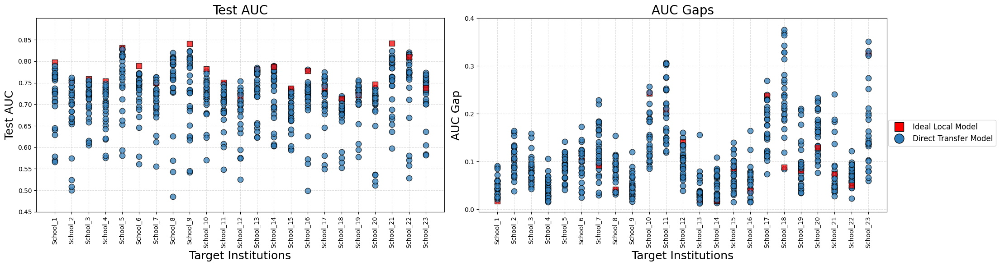

In [ ]:
def plot_auc_scores_and_gaps(auc_matrix, gap_matrix, export_path=None):
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))  
    non_local_color = plt.cm.Blues(0.7) 
    local_color = 'red'

    
    ax1 = axes[0]
    for idx, target_school in enumerate(auc_matrix.columns):
        auc_scores = auc_matrix[target_school]
        x = np.full_like(auc_scores, idx)
        colors = [local_color if auc_scores[i] == auc_scores[idx] else non_local_color for i in range(len(auc_scores))]
        markers = ['s' if auc_scores[i] == auc_scores[idx] else 'o' for i in range(len(auc_scores))]
        for i, (color, marker) in enumerate(zip(colors, markers)):
            ax1.scatter(x[i], auc_scores[i], c=color, s=80, edgecolor='black', alpha=0.75, marker=marker) 
    ax1.set_xticks(range(len(auc_matrix.columns)))
    ax1.set_xticklabels(auc_matrix.columns, rotation=90, fontsize=10)
    ax1.set_yticks(np.arange(0.45, 0.90, 0.05))  
    ax1.set_ylim(0.45, 0.9) 
    ax1.set_xlabel('Target Institutions', fontsize=18)
    ax1.set_ylabel('Test AUC', fontsize=18)
    ax1.grid(True, linestyle='--', alpha=0.4)  
    ax1.set_title('Test AUC', fontsize=20)

    ax2 = axes[1]
    for idx, target_school in enumerate(gap_matrix.columns):
        auc_gaps = gap_matrix[target_school]
        x = np.full_like(auc_gaps, idx)
        colors = [local_color if auc_gaps[i] == auc_gaps[idx] else non_local_color for i in range(len(auc_gaps))]
        markers = ['s' if auc_gaps[i] == auc_gaps[idx] else 'o' for i in range(len(auc_gaps))]

        for i, (color, marker) in enumerate(zip(colors, markers)):
            ax2.scatter(x[i], auc_gaps[i], c=color, s=80, edgecolor='black', alpha=0.75, marker=marker) 

    ax2.set_xticks(range(len(gap_matrix.columns)))
    ax2.set_xticklabels(gap_matrix.columns, rotation=90, fontsize=10)
    ax2.set_yticks(np.arange(0, max(gap_matrix.max()) + 0.1, 0.1))  
    ax2.set_xlabel('Target Institutions', fontsize=18)
    ax2.set_ylabel('AUC Gap', fontsize=18)
    ax2.grid(True, linestyle='--', alpha=0.4)  
    ax2.set_title('AUC Gaps', fontsize=20)


    handles = [
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=local_color, markeredgecolor='black', markersize=15, label='Ideal Local Model'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=non_local_color, markeredgecolor='black', markersize=15, label='Direct Transfer Model')
    ]

  
    fig.legend(handles=handles, loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12)  
    plt.tight_layout(rect=[0, 0, 0.99, 1])  


    if export_path:
        plt.savefig(export_path, format='png', dpi=500, bbox_inches='tight')

    plt.show()

### Contextual Similarity Matrix and Performance

In [ ]:
average_similarity = pd.read_csv('averaged_similarity_df.csv', index_col=0)  

In [ ]:
# modify the average_similarity so that there is no local model 
average_similarity = average_similarity[average_similarity['institution_1'] != average_similarity['institution_2']]

In [ ]:
### Regression Results for RQ1 performance drop
auc_long = auc_matrix_direct.reset_index().melt(id_vars='index', var_name='test_school', value_name='auc_score')
auc_long = auc_long.rename(columns={'index': 'train_school'})

local_auc = auc_long[auc_long['train_school'] == auc_long['test_school']].set_index('test_school')['auc_score']

auc_long = auc_long[auc_long['train_school'] != auc_long['test_school']]

merged_data = auc_long.merge(average_similarity, 
                             left_on=['train_school', 'test_school'], 
                             right_on=['institution_1', 'institution_2'], 
                             how='left')

merged_data['local_auc'] = merged_data['test_school'].map(local_auc)

merged_data['performance_drop'] = merged_data['local_auc'] - merged_data['auc_score']
merged_data = merged_data[merged_data['train_school'] != merged_data['test_school']]
merged_data = merged_data.drop_duplicates(subset=['train_school', 'test_school'])
X = merged_data[['school_similarity', 'academic_similarity', 'demographic_similarity', 
                 'cost_similarity', 'completion_similarity', 'aid_similarity']]
X = sm.add_constant(X)  

y = merged_data['performance_drop']  


model = sm.OLS(y, X)
results = model.fit()


print(results.summary())

coefficients = results.params
p_values = results.pvalues

weights = {}

for feature in X.columns[1:]:
    beta = coefficients[feature]  
    
    if beta  > 0:
        continue
    p_value = p_values[feature] 
    
    weight = abs(beta) / (1 + p_value)
    
    weights[feature] = weight

total_weight = sum(weights.values())
normalized_weights = {feature: weight / total_weight for feature, weight in weights.items()}


print("\nNormalized Weights for Each Predictor (based on coefficients and p-values):")
for feature, weight in normalized_weights.items():
    print(f"{feature}: {weight:.4f}")


                            OLS Regression Results                            
Dep. Variable:       performance_drop   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     147.8
Date:                Wed, 01 Jan 2025   Prob (F-statistic):          3.93e-114
Time:                        18:24:29   Log-Likelihood:                 1061.0
No. Observations:                 598   AIC:                            -2108.
Df Residuals:                     591   BIC:                            -2077.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [ ]:
# AUC Gap regression results
auc_long = auc_gap_matrix.reset_index().melt(id_vars='index', var_name='test_school', value_name='auc_gap')
auc_long = auc_long.rename(columns={'index': 'train_school'})

auc_long = auc_long[auc_long['train_school'] != auc_long['test_school']]

merged_data = auc_long.merge(average_similarity, 
                             left_on=['train_school', 'test_school'], 
                             right_on=['institution_1', 'institution_2'], 
                             how='left')

merged_data['school_similarity'] = pd.to_numeric(merged_data['school_similarity'], errors='coerce')
merged_data['academic_similarity'] = pd.to_numeric(merged_data['academic_similarity'], errors='coerce')
merged_data['demographic_similarity'] = pd.to_numeric(merged_data['demographic_similarity'], errors='coerce')
merged_data['cost_similarity'] = pd.to_numeric(merged_data['cost_similarity'], errors='coerce')
merged_data['completion_similarity'] = pd.to_numeric(merged_data['completion_similarity'], errors='coerce')
merged_data['aid_similarity'] = pd.to_numeric(merged_data['aid_similarity'], errors='coerce')
merged_data['auc_gap'] = pd.to_numeric(merged_data['auc_gap'], errors='coerce')

merged_data = merged_data.dropna()

X = merged_data[['school_similarity', 'academic_similarity', 'demographic_similarity', 
                 'cost_similarity', 'completion_similarity', 'aid_similarity']]
X = sm.add_constant(X)  
y = merged_data['auc_gap']  

model = sm.OLS(y, X)
results_auc_gap = model.fit()

print(results_auc_gap.summary())


                            OLS Regression Results                            
Dep. Variable:                auc_gap   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.046
Method:                 Least Squares   F-statistic:                     5.804
Date:                Wed, 01 Jan 2025   Prob (F-statistic):           6.88e-06
Time:                        18:24:57   Log-Likelihood:                 764.21
No. Observations:                 598   AIC:                            -1514.
Df Residuals:                     591   BIC:                            -1484.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3533514719.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(coeff1.index, rotation=45, ha='right', fontsize=15)
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_26139/3533514719.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(coeff2.index, rotation=45, ha='right', fontsize=15)


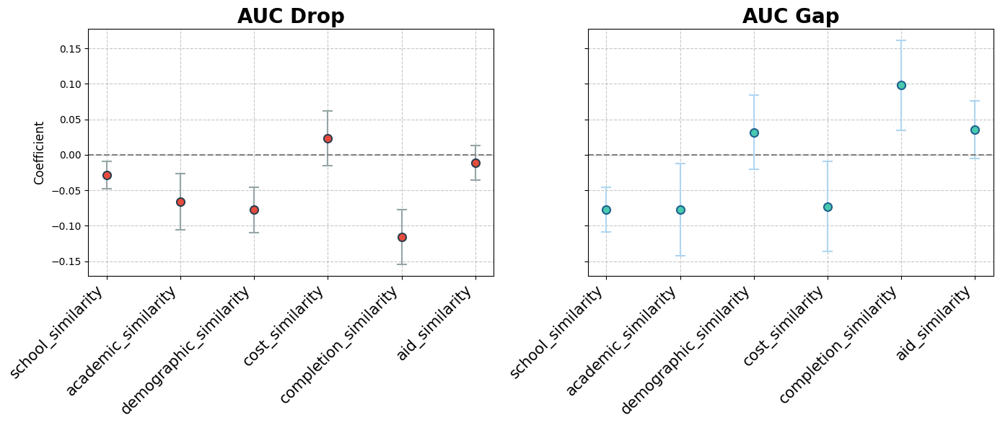

In [ ]:
#Visualization of the regression results

coeff1 = results.params[1:]  
conf1 = results.conf_int().iloc[1:]  

coeff2 = results_auc_gap.params[1:]  
conf2 = results_auc_gap.conf_int().iloc[1:]  

error1_lower = coeff1 - conf1[0]
error1_upper = conf1[1] - coeff1

error2_lower = coeff2 - conf2[0]
error2_upper = conf2[1] - coeff2

error1_lower = error1_lower.values
error1_upper = error1_upper.values
error2_lower = error2_lower.values
error2_upper = error2_upper.values

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# First plot (AUC Drop)
axes[0].errorbar(x=coeff1.index, y=coeff1, yerr=[error1_lower, error1_upper],
                 fmt='o', capsize=5, capthick=2, color='#2C3E50', ecolor='#95A5A6',
                 markerfacecolor='#E74C3C', markeredgewidth=1.5, markersize=8)
axes[0].axhline(0, color='grey', linestyle='--', linewidth=1.5)
axes[0].set_title('AUC Drop', fontsize=20, fontweight='bold')
axes[0].set_ylabel('Coefficient', fontsize=12)
axes[0].set_xticklabels(coeff1.index, rotation=45, ha='right', fontsize=15)

# Second plot (AUC Gap)
axes[1].errorbar(x=coeff2.index, y=coeff2, yerr=[error2_lower, error2_upper],
                 fmt='o', capsize=5, capthick=2, color='#1F618D', ecolor='#AED6F1',
                 markerfacecolor='#48C9B0', markeredgewidth=1.5, markersize=8)
axes[1].axhline(0, color='grey', linestyle='--', linewidth=1.5)
axes[1].set_title('AUC Gap', fontsize=20, fontweight='bold')
axes[1].set_xticklabels(coeff2.index, rotation=45, ha='right', fontsize=15)


####  Overall similarity 

In [ ]:
average_similarity['overall_similarity'] = (
    average_similarity['school_similarity'] * normalized_weights['school_similarity'] +
    average_similarity['academic_similarity'] * normalized_weights['academic_similarity'] +
    average_similarity['demographic_similarity'] * normalized_weights['demographic_similarity'] +
    average_similarity['cost_similarity'] *  normalized_weights['cost_similarity'] +
    average_similarity['completion_similarity'] * normalized_weights['completion_similarity'] +
    average_similarity['aid_similarity'] * normalized_weights['aid_similarity']
)

train_only_schools = ['source-only institutions']

filtered_similarity = average_similarity[(average_similarity['institution_1'] != average_similarity['institution_2']) &
                                         (~average_similarity['institution_2'].isin(train_only_schools))]

most_similar_schools = filtered_similarity.loc[filtered_similarity.groupby('institution_2')['overall_similarity'].idxmax()]
auc_matrix_direct_long = auc_matrix_direct.reset_index().melt(id_vars='index', var_name='test_school', value_name='auc_score')
auc_matrix_direct_long = auc_matrix_direct_long.rename(columns={'index': 'train_school'})

auc_gap_matrix_long = auc_gap_matrix.reset_index().melt(id_vars='index', var_name='test_school', value_name='auc_gap')
auc_gap_matrix_long = auc_gap_matrix_long.rename(columns={'index': 'train_school'})

merged_auc_data = most_similar_schools.merge(auc_matrix_direct_long, left_on=['institution_1', 'institution_2'], right_on=['train_school', 'test_school'], how='left')

merged_auc_data = merged_auc_data.rename(columns={'test_school': 'test_school_merged_1'})

merged_auc_data = merged_auc_data.merge(auc_gap_matrix_long, left_on=['institution_1', 'institution_2'], right_on=['train_school', 'test_school'], how='left', suffixes=('_auc', '_gap'))

#  Calculate the expected AUC and AUC gap (average AUC and AUC gap for each test school), excluding local models and the source-only schools
auc_matrix_direct_no_local = auc_matrix_direct_long[(auc_matrix_direct_long['train_school'] != auc_matrix_direct_long['test_school']) &
                                                    (~auc_matrix_direct_long['test_school'].isin(train_only_schools))]

auc_gap_matrix_no_local = auc_gap_matrix_long[(auc_gap_matrix_long['train_school'] != auc_gap_matrix_long['test_school']) &
                                              (~auc_gap_matrix_long['test_school'].isin(train_only_schools))]

expected_auc = auc_matrix_direct_no_local.groupby('test_school')['auc_score'].mean().reset_index().rename(columns={'auc_score': 'expected_auc'})
expected_auc_gap = auc_gap_matrix_no_local.groupby('test_school')['auc_gap'].mean().reset_index().rename(columns={'auc_gap': 'expected_auc_gap'})

merged_auc_data = merged_auc_data.merge(expected_auc, left_on='institution_2', right_on='test_school', how='left', suffixes=('', '_expected'))
merged_auc_data = merged_auc_data.merge(expected_auc_gap, left_on='institution_2', right_on='test_school', how='left', suffixes=('', '_gap_expected'))

local_auc = auc_matrix_direct_long[(auc_matrix_direct_long['train_school'] == auc_matrix_direct_long['test_school']) &
                                   (~auc_matrix_direct_long['test_school'].isin(train_only_schools))]

local_auc_gap = auc_gap_matrix_long[(auc_gap_matrix_long['train_school'] == auc_gap_matrix_long['test_school']) &
                                    (~auc_gap_matrix_long['test_school'].isin(train_only_schools))]

local_auc = local_auc.rename(columns={'auc_score': 'local_auc_score'})
local_auc_gap = local_auc_gap.rename(columns={'auc_gap': 'local_auc_gap'})

final_data = merged_auc_data.merge(local_auc[['test_school', 'local_auc_score']], left_on='institution_2', right_on='test_school', how='left')
final_data = final_data.merge(local_auc_gap[['test_school', 'local_auc_gap']], left_on='institution_2', right_on='test_school', how='left')

final_table = final_data[['institution_2', 'institution_1', 'overall_similarity', 'auc_score', 'auc_gap', 'expected_auc', 'expected_auc_gap', 'local_auc_score', 'local_auc_gap']]
final_table = final_table.rename(columns={'institution_2': 'test_school', 'institution_1': 'most_similar_train_school'})

print(final_table)


             test_school most_similar_train_school  overall_similarity  \
0             Blue_Ridge                  Germanna            0.875431   
1            Brightpoint         Piedmont_Virginia            0.863839   
2       Central_Virginia         Piedmont_Virginia            0.879390   
3               Danville                 New_River            0.844696   
4          Eastern_Shore              Paul_D._Camp            0.836185   
5               Germanna         Piedmont_Virginia            0.894367   
6   J._Sargeant_Reynolds        Virginia_Peninsula            0.872743   
7           Laurel_Ridge                Blue_Ridge            0.874461   
8        Mountain_Empire        Southwest_Virginia            0.911843   
9       Mountain_Gateway              Rappahannock            0.836313   
10             New_River          Central_Virginia            0.853086   
11     Northern_Virginia         Piedmont_Virginia            0.785446   
12         Patrick_Henry        Southw

In [49]:
overall_similarity = average_similarity.pivot(index='institution_1', columns='institution_2', values='overall_similarity')
overall_similarity 

institution_2,Blue_Ridge,Brightpoint,Central_Virginia,Danville,Eastern_Shore,Germanna,J._Sargeant_Reynolds,Laurel_Ridge,Mountain_Empire,Mountain_Gateway,...,Southwest_Virginia,Tidewater,Virginia_Highlands,Virginia_Peninsula,Virginia_Western,Wytheville,asu,asuo,uci,um
institution_1,,,,,,,,,,,,,,,,,,,,,
Blue_Ridge,NaN,0.798434,0.861996,0.811060,0.773651,0.875431,0.717948,0.874461,0.769247,0.832309,...,0.801483,0.703262,0.812924,0.731809,0.825082,0.835827,0.435640,0.435640,0.296447,0.295785
Brightpoint,0.798434,NaN,0.846923,0.790595,0.777828,0.849060,0.855647,0.781613,0.680410,0.763448,...,0.696272,0.841304,0.739318,0.861612,0.841513,0.726643,0.385977,0.385977,0.217501,0.206090
Central_Virginia,0.861996,0.846923,NaN,0.842763,0.779399,0.858154,0.763883,0.820223,0.752695,0.818040,...,0.780811,0.735034,0.811057,0.768778,0.865058,0.802372,0.418524,0.418524,0.269181,0.281433
Danville,0.811060,0.790595,0.842763,NaN,0.806944,0.808729,0.742878,0.788287,0.783892,0.794940,...,0.793360,0.712492,0.815600,0.738579,0.814675,0.797894,0.347594,0.347594,0.204679,0.213045
Eastern_Shore,0.773651,0.777828,0.779399,0.806944,NaN,0.790277,0.771778,0.778243,0.713943,0.734258,...,0.722713,0.708248,0.741735,0.759330,0.739794,0.745384,0.304972,0.304972,0.178715,0.145611
Germanna,0.875431,0.849060,0.858154,0.808729,0.790277,NaN,0.752462,0.860702,0.731249,0.795989,...,0.762562,0.757493,0.768540,0.802388,0.820438,0.786430,0.419744,0.419744,0.273191,0.241174
J._Sargeant_Reynolds,0.717948,0.855647,0.763883,0.742878,0.771778,0.752462,NaN,0.737520,0.629860,0.681959,...,0.623047,0.840081,0.677218,0.872743,0.804828,0.660409,0.355682,0.355682,0.160901,0.162771
Laurel_Ridge,0.874461,0.781613,0.820223,0.788287,0.778243,0.860702,0.737520,NaN,0.813966,0.809351,...,0.811787,0.682943,0.779657,0.731109,0.801507,0.837345,0.438066,0.438066,0.285322,0.284853
Mountain_Empire,0.769247,0.680410,0.752695,0.783892,0.713943,0.731249,0.629860,0.813966,NaN,0.792790,...,0.911843,0.585760,0.862194,0.622652,0.736399,0.839272,0.357935,0.357935,0.245821,0.245335


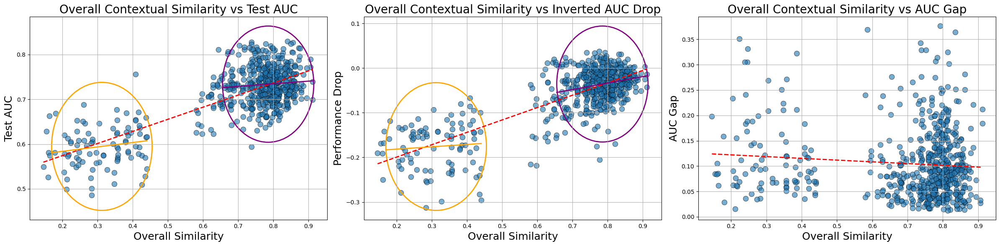

In [ ]:
# Visualization of the relationship between overall similarity score and the test AUC, performance drop, and AUC gap
auc_long = auc_matrix_direct.reset_index().melt(id_vars='index', var_name='test_school', value_name='auc_score')
auc_long = auc_long.rename(columns={'index': 'train_school'})


local_auc = auc_long[auc_long['train_school'] == auc_long['test_school']].set_index('test_school')['auc_score']


auc_long = auc_long[auc_long['train_school'] != auc_long['test_school']]


merged_data = auc_long.merge(average_similarity, 
                             left_on=['train_school', 'test_school'], 
                             right_on=['institution_1', 'institution_2'], 
                             how='left')


merged_data['local_auc'] = merged_data['test_school'].map(local_auc)


merged_data['performance_drop'] = merged_data['auc_score'] - merged_data['local_auc']


auc_gap_long = auc_gap_matrix.reset_index().melt(id_vars='index', var_name='test_school', value_name='auc_gap')
auc_gap_long = auc_gap_long.rename(columns={'index': 'train_school'})


merged_data = merged_data.merge(auc_gap_long, 
                                on=['train_school', 'test_school'], 
                                how='left')


merged_data = merged_data.dropna(subset=['overall_similarity', 'auc_gap'])  
merged_data = merged_data[merged_data['overall_similarity'] != 1]  


def plot_linear_regression(x, y, ax):
    x = np.array(x).reshape(-1, 1)
    y = np.array(y)
    model = LinearRegression().fit(x, y)
    x_vals = np.linspace(x.min(), x.max(), 100)
    y_vals = model.predict(x_vals.reshape(-1, 1))
    ax.plot(x_vals, y_vals, color='red', linestyle='--', linewidth=2)

def draw_small_regression_line(cluster_points, x_col, y_col, ax, color, x_center, x_radius):
    x_cluster = cluster_points[x_col]
    y_cluster = cluster_points[y_col]
    
    if len(x_cluster) > 0 and len(y_cluster) > 0:
        x_vals = np.array(x_cluster).reshape(-1, 1)
        y_vals = np.array(y_cluster)
        model = LinearRegression().fit(x_vals, y_vals)
        
        x_min = max(x_cluster.min(), x_center - x_radius)
        x_max = min(x_cluster.max(), x_center + x_radius)
        
        x_range = np.linspace(x_min, x_max, 100)  
        y_range = model.predict(x_range.reshape(-1, 1))
        
        ax.plot(x_range, y_range, color=color, linewidth=2)


def add_cluster_circles_with_regression(ax, x_data, y_data, lower_bound, upper_bound, color):
    cluster_points = merged_data[(x_data >= lower_bound) & (x_data <= upper_bound)]
    x_cluster = cluster_points['overall_similarity']
    y_cluster = cluster_points[y_data]
    
    if len(x_cluster) > 0 and len(y_cluster) > 0:
        x_center = np.mean(x_cluster)
        y_center = np.mean(y_cluster)
        x_radius = (x_cluster.max() - x_cluster.min()) / 2
        y_radius = (y_cluster.max() - y_cluster.min()) / 2
        circle = plt.Circle((x_center, y_center), max(x_radius, y_radius), color=color, fill=False, linewidth=2)
        ax.add_patch(circle)
        
        draw_small_regression_line(cluster_points, 'overall_similarity', y_data, ax, color, x_center, x_radius)


fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# First plot: Similarity vs AUC Score (with linear regression line)
sns.scatterplot(x=merged_data['overall_similarity'], y=merged_data['auc_score'], alpha=0.6, edgecolor='k', s=80, ax=axes[0])
plot_linear_regression(merged_data['overall_similarity'], merged_data['auc_score'], axes[0])

add_cluster_circles_with_regression(axes[0], merged_data['overall_similarity'], 'auc_score', 0.15, 0.45, color='orange')
add_cluster_circles_with_regression(axes[0], merged_data['overall_similarity'], 'auc_score', 0.65, 0.95, color='purple')

axes[0].set_title('Overall Contextual Similarity vs Test AUC', fontsize=20)
axes[0].set_xlabel('Overall Similarity', fontsize=18)
axes[0].set_ylabel('Test AUC', fontsize=18)
axes[0].grid(True)

# Second plot: Similarity vs Performance Drop (with linear regression line)
sns.scatterplot(x=merged_data['overall_similarity'], y=merged_data['performance_drop'], alpha=0.6, edgecolor='k', s=80, ax=axes[1])
plot_linear_regression(merged_data['overall_similarity'], merged_data['performance_drop'], axes[1])

add_cluster_circles_with_regression(axes[1], merged_data['overall_similarity'], 'performance_drop', 0.15, 0.45, color='orange')
add_cluster_circles_with_regression(axes[1], merged_data['overall_similarity'], 'performance_drop', 0.65, 0.95, color='purple')

axes[1].set_title('Overall Contextual Similarity vs Inverted AUC Drop', fontsize=20)
axes[1].set_xlabel('Overall Similarity', fontsize=18)
axes[1].set_ylabel('Performance Drop', fontsize=18)
axes[1].grid(True)

# Third plot: Similarity vs AUC Gap (with linear regression line)
sns.scatterplot(x=merged_data['overall_similarity'], y=merged_data['auc_gap'], alpha=0.6, edgecolor='k', s=80, ax=axes[2])
plot_linear_regression(merged_data['overall_similarity'], merged_data['auc_gap'], axes[2])

axes[2].set_title('Overall Contextual Similarity vs AUC Gap', fontsize=20)
axes[2].set_xlabel('Overall Similarity', fontsize=18)
axes[2].set_ylabel('AUC Gap', fontsize=18)
axes[2].grid(True)

plt.tight_layout()
plt.show()


## RQ2

### Most similar Model Selection

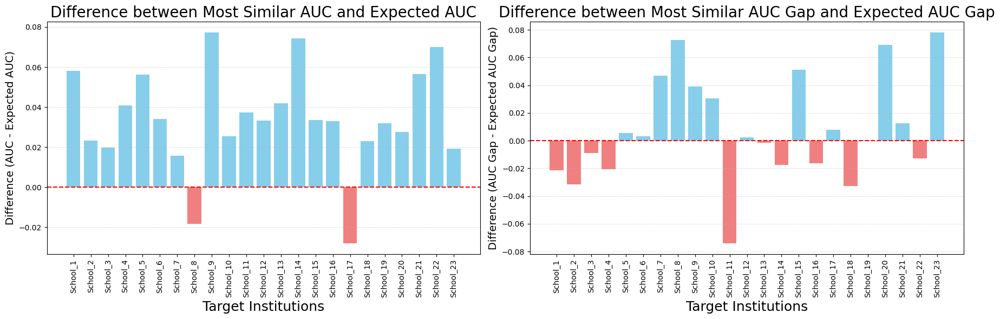

In [ ]:

final_table_deidentified = final_table.copy()
final_table_deidentified['test_school'] = final_table['test_school'].map(name_mapping).fillna(final_table['test_school'])

final_table_deidentified['test_school_numeric'] = final_table_deidentified['test_school'].apply(lambda x: int(x.split('_')[1]))

final_table_deidentified = final_table_deidentified.sort_values(by='test_school_numeric').drop(columns='test_school_numeric')

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

positive_color = 'skyblue'
negative_color = 'lightcoral'

# Plot 1: Difference between Most Similar AUC and Expected AUC
diff_auc = final_table_deidentified['auc_score'] - final_table_deidentified['expected_auc']
colors_auc = [positive_color if x >= 0 else negative_color for x in diff_auc]
axes[0].bar(final_table_deidentified['test_school'], diff_auc, color=colors_auc)

axes[0].set_title('Difference between Most Similar AUC and Expected AUC', fontsize=20)
axes[0].set_xlabel('Target Institutions', fontsize=18)
axes[0].set_ylabel('Difference (AUC - Expected AUC)', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].axhline(0, color='red', linestyle='--', linewidth=1.5)
axes[0].grid(True, axis='y', linestyle=':', linewidth=0.7, alpha=0.8)  

# Plot 2: Difference between Most Similar AUC Gap and Expected AUC Gap
diff_auc_gap = final_table_deidentified['auc_gap'] - final_table_deidentified['expected_auc_gap']
colors_auc_gap = [positive_color if x >= 0 else negative_color for x in diff_auc_gap]
axes[1].bar(final_table_deidentified['test_school'], diff_auc_gap, color=colors_auc_gap)

axes[1].set_title('Difference between Most Similar AUC Gap and Expected AUC Gap', fontsize=20)
axes[1].set_xlabel('Target Institutions', fontsize=18)
axes[1].set_ylabel('Difference (AUC Gap - Expected AUC Gap)', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].axhline(0, color='red', linestyle='--', linewidth=1.5)
axes[1].grid(True, axis='y', linestyle=':', linewidth=0.7, alpha=0.8) 


plt.tight_layout()
plt.show()


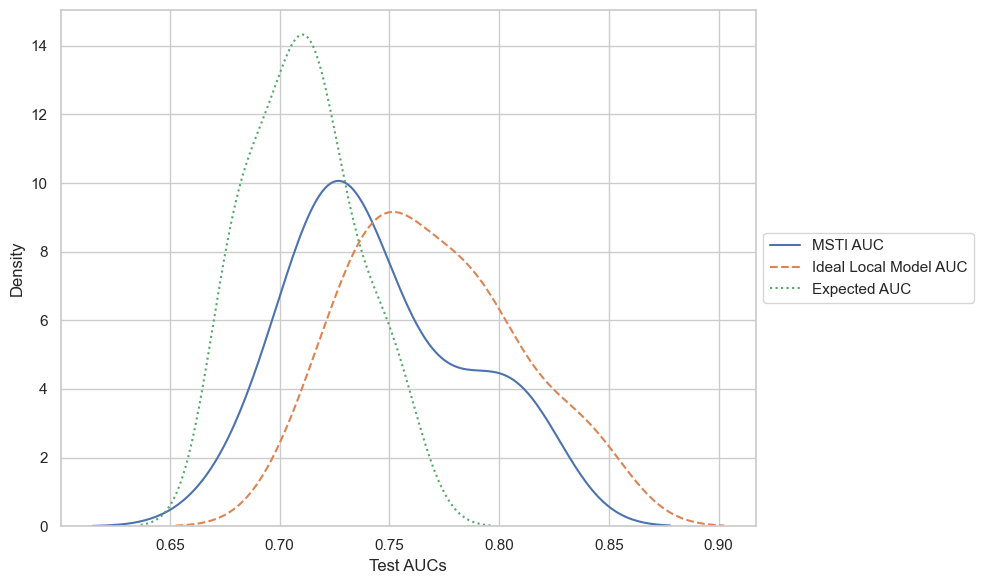

In [ ]:
# Plot the KDE for each AUC distribution without fill and with different line styles

plt.figure(figsize=(10, 6))

sns.kdeplot(final_table['auc_score'], label='MSTI AUC', linestyle='-', fill=False)
sns.kdeplot(final_table['local_auc_score'], label='Ideal Local Model AUC', linestyle='--', fill=False)
sns.kdeplot(final_table['expected_auc'], label='Expected AUC', linestyle=':', fill=False)

plt.xlabel('Test AUCs',font)
plt.ylabel('Density')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)
plt.tight_layout()
plt.show()


In [638]:
# Calculate the range of Test AUCs
auc_score_range = (final_table['auc_score'].min(), final_table['auc_score'].max())
local_auc_score_range = (final_table['local_auc_score'].min(), final_table['local_auc_score'].max())
expected_auc_range = (final_table['expected_auc'].min(), final_table['expected_auc'].max())

print(f"MSTI AUC Range: {auc_score_range}")
print(f"Ideal Local Model AUC Range: {local_auc_score_range}")
print(f"Expected AUC Range: {expected_auc_range}")

# Calculate Wasserstein distances between the distributions
wasserstein_msti_local = wasserstein_distance(final_table['auc_score'], final_table['local_auc_score'])
wasserstein_msti_expected = wasserstein_distance(final_table['auc_score'], final_table['expected_auc'])
wasserstein_local_expected = wasserstein_distance(final_table['local_auc_score'], final_table['expected_auc'])

print(f"Wasserstein Distance between MSTI AUC and Ideal Local Model AUC: {wasserstein_msti_local}")
print(f"Wasserstein Distance between MSTI AUC and Expected AUC: {wasserstein_msti_expected}")
print(f"Wasserstein Distance between Ideal Local Model AUC and Expected AUC: {wasserstein_local_expected}")

MSTI AUC Range: (np.float64(0.6776600592390065), np.float64(0.8150536363050067))
Ideal Local Model AUC Range: (np.float64(0.7132899784627809), np.float64(0.8419394225845839))
Expected AUC Range: (np.float64(0.6754464166302957), np.float64(0.7588234973924615))
Wasserstein Distance between MSTI AUC and Ideal Local Model AUC: 0.025391008079646907
Wasserstein Distance between MSTI AUC and Expected AUC: 0.03418556035060353
Wasserstein Distance between Ideal Local Model AUC and Expected AUC: 0.05957656843025043


### Sequential Training 

In [ ]:
RQ2_2 = final_table[['test_school', 'most_similar_train_school', 'auc_score', 'auc_gap']]


,test_school,most_similar_train_school,auc_score,auc_gap
0,Blue_Ridge,Germanna,0.814062,0.056476
1,Brightpoint,Piedmont_Virginia,0.731317,0.026157
2,Central_Virginia,Piedmont_Virginia,0.714766,0.125972
3,Danville,New_River,0.711471,0.227891
4,Eastern_Shore,Paul_D._Camp,0.677660,0.176777
5,Germanna,Piedmont_Virginia,0.770557,0.03915
6,J._Sargeant_Reynolds,Virginia_Peninsula,0.815054,0.092901
7,Laurel_Ridge,Blue_Ridge,0.725308,0.075239
8,Mountain_Empire,Southwest_Virginia,0.699165,0.211905
9,Mountain_Gateway,Rappahannock,0.739930,0.251736


In [123]:
demographic_similarity2 = merged_data[['test_school','train_school','demographic_similarity']]
demographic_similarity2

,test_school,train_school,demographic_similarity
0,Tidewater,Piedmont_Virginia,0.719332
1,Tidewater,Laurel_Ridge,0.638302
2,Tidewater,Brightpoint,0.817200
3,Tidewater,J._Sargeant_Reynolds,0.766672
4,Tidewater,Virginia_Western,0.648352
...,...,...,...
593,Mountain_Gateway,Blue_Ridge,0.777118
594,Mountain_Gateway,uci,0.149279
595,Mountain_Gateway,asuo,0.368969
596,Mountain_Gateway,asu,0.368969


In [ ]:
demographic_similarity2_pivoted = demographic_similarity2.pivot(index='train_school', columns='test_school', values='demographic_similarity')

In [ ]:
dissimilar_results = []

for test_school in demographic_similarity2_pivoted.columns:
    
    # Get the demographic similarity and context similarity scores for the current test school
    demographic_scores = demographic_similarity2_pivoted[test_school]
    context_scores = overall_similarity[test_school]
    
    # Exclude the test school itself by setting its demographic similarity to a extremely big value
    demographic_scores.loc[test_school] = 5
    valid_train_schools = context_scores[context_scores >0.6].index
    filtered_demographic_scores = demographic_scores.loc[valid_train_schools]
    
    # Find the train school with the maximum demographic similarity (most dissimilar)
    most_dissimilar_train_school = filtered_demographic_scores.idxmin()
    demographic_max_score = filtered_demographic_scores.min()
    
    dissimilar_results.append({
        'Test School1': test_school,
        'Train School2': most_dissimilar_train_school,
        'Max Demographic Dissimilarity': demographic_max_score
    })

dissimilar_results_df = pd.DataFrame(dissimilar_results)

from IPython.display import display
display(dissimilar_results_df)


,Test School1,Train School2,Max Demographic Dissimilarity
0,Blue_Ridge,Northern_Virginia,0.540375
1,Brightpoint,Mountain_Empire,0.563374
2,Central_Virginia,Northern_Virginia,0.590763
3,Danville,Northern_Virginia,0.464030
4,Eastern_Shore,Northern_Virginia,0.485908
5,Germanna,Mountain_Empire,0.547466
6,J._Sargeant_Reynolds,Mountain_Empire,0.473198
7,Laurel_Ridge,Northern_Virginia,0.505122
8,Mountain_Empire,Virginia_Peninsula,0.465833
9,Mountain_Gateway,Northern_Virginia,0.348810


In [ ]:
sequential_matrix = pd.merge(RQ2_2, 
                             dissimilar_results_df[['Test School1', 'Train School2']], 
                             left_on='most_similar_train_school',  
                             right_on='Test School1',  
                             how='left')

sequential_matrix = sequential_matrix.drop(columns=['Test School1'])
sequential_matrix


,test_school,most_similar_train_school,auc_score,auc_gap,Train School2
0,Blue_Ridge,Germanna,0.814062,0.056476,Mountain_Empire
1,Brightpoint,Piedmont_Virginia,0.731317,0.026157,Northern_Virginia
2,Central_Virginia,Piedmont_Virginia,0.714766,0.125972,Northern_Virginia
3,Danville,New_River,0.711471,0.227891,Paul_D._Camp
4,Eastern_Shore,Paul_D._Camp,0.677660,0.176777,Northern_Virginia
5,Germanna,Piedmont_Virginia,0.770557,0.03915,Northern_Virginia
6,J._Sargeant_Reynolds,Virginia_Peninsula,0.815054,0.092901,Mountain_Empire
7,Laurel_Ridge,Blue_Ridge,0.725308,0.075239,Northern_Virginia
8,Mountain_Empire,Southwest_Virginia,0.699165,0.211905,Virginia_Peninsula
9,Mountain_Gateway,Rappahannock,0.739930,0.251736,Northern_Virginia


### EWC sequential training

In [ ]:
demographic_groups = {
    'male_non_urm': {'sex': 'Male', 'urm_status': 0},
    'female_non_urm': {'sex': 'Female', 'urm_status': 0},
    'male_urm': {'sex': 'Male', 'urm_status': 1},
    'female_urm': {'sex': 'Female', 'urm_status': 1}
}

auc_matrix_direct_sequential = pd.DataFrame(index=schools, columns=schools)
auc_matrices_sequential = {group: pd.DataFrame(index=schools, columns=schools) for group in demographic_groups}

def compute_fisher_information(models, dataloader, criterion, device):
    fisher_information = {model_name: {} for model_name in models}

    for model in models.values():
        model.eval()
    
    # Compute Fisher Information Matrix by accumulating gradients for each model
    for features, labels in dataloader:
        features, labels = features.to(device), labels.to(device)
        
        for model in models.values():
            model.zero_grad()
        
        outputs = models['netF'](features)
        outputs = models['netB'](outputs)
        outputs = models['netC'](outputs)
        
        loss = criterion(outputs, labels)
        loss.backward()

        for model_name, model in models.items():
            for name, param in model.named_parameters():
                if param.grad is not None:
                    if name not in fisher_information[model_name]:
                        fisher_information[model_name][name] = torch.zeros_like(param).to(device)
                    fisher_information[model_name][name] += param.grad ** 2

    for model_name, info in fisher_information.items():
        for name in info:
            fisher_information[model_name][name] /= len(dataloader)
    
    return fisher_information

def ewc_loss(models, fisher_information, prev_params, ewc_lambda, device):
    """ Computes the EWC loss based on the Fisher Information and previous parameter values """
    ewc_penalty = 0
    for model_name, model in models.items():
        for name, param in model.named_parameters():
            if name in fisher_information[model_name]:
                ewc_penalty += (fisher_information[model_name][name] * (param - prev_params[model_name][name]).pow(2)).sum()

    return ewc_lambda * ewc_penalty

# Lambda for EWC 
ewc_lambda = 0.8

for idx, row in sequential_matrix.iterrows():
    train_school = row['most_similar_train_school']
    train_school2 = row['Train School2']
    test_school = row['test_school']
    combined_name = f"{train_school}+{train_school2}"  
    
    print(f"Loading model for Train School {train_school}, training on {train_school2}, and testing on {test_school}...")

    # Load the saved model and scaler for Train School
    model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
    model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
    model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
    scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

    input_dim = train_features.shape[1]
    netF = RetentionFeatureExtractor(input_dim).to(device)
    netB = RetentionBottleneck().to(device)
    netC = RetentionClassifier().to(device)

    netF.load_state_dict(torch.load(model_f_filename, map_location=device))
    netB.load_state_dict(torch.load(model_b_filename, map_location=device))
    netC.load_state_dict(torch.load(model_c_filename, map_location=device))

    scaler = joblib.load(scaler_filename)

    # Prepare Train School2 data for training
    train_data2 = school_data[train_school2][(school_data[train_school2]['year'] >= 2012) & (school_data[train_school2]['year'] <= 2018)]
    train_features2 = train_data2[cols].values
    train_labels2 = train_data2['retention'].values
    train_features_scaled2 = scaler.transform(train_features2)
    

    train_tensor2 = TensorDataset(torch.tensor(train_features_scaled2, dtype=torch.float32), 
                                  torch.tensor(train_labels2, dtype=torch.float32).view(-1, 1))
    train_loader2 = DataLoader(train_tensor2, batch_size=32, shuffle=True)


    models = {'netF': netF, 'netB': netB, 'netC': netC}

    # Fisher Information Calculation for EWC
    print("Calculating Fisher Information for Train School...")
    fisher_information = compute_fisher_information(models, train_loader2, nn.BCELoss(), device)
    
    # Save previous parameters for all models before fine-tuning
    prev_params = {model_name: {name: param.clone().detach() for name, param in model.named_parameters()} for model_name, model in models.items()}

    # Train the model on Train School2
    netF.train()
    netB.train()
    netC.train()
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(list(netF.parameters()) + list(netB.parameters()) + list(netC.parameters()), lr=0.001)

    for epoch in range(10): 
        for features, labels in train_loader2:
            if features.size(0) <= 1:
                continue

            optimizer.zero_grad()
            outputs = netF(features.to(device))
            outputs = netB(outputs)
            outputs = netC(outputs) 
            
            loss = criterion(outputs, labels.to(device)) 

            ewc_penalty = ewc_loss(models, fisher_information, prev_params, ewc_lambda, device)
            total_loss = loss + ewc_penalty

            total_loss.backward()
            optimizer.step()

    # Evaluation on the Test School for direct transfer and demographic subgroups
    eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
    eval_features = eval_data[cols].values
    eval_labels = eval_data['retention'].values

    eval_features_scaled = scaler.transform(eval_features)
    
    eval_tensor = TensorDataset(
        torch.tensor(eval_features_scaled, dtype=torch.float32), 
        torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
    )
    eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)

    eval_predictions = []
    eval_actuals = []

    netF.eval()
    netB.eval()
    netC.eval()

    with torch.no_grad():
        for features, labels in eval_loader:
            if features.size(0) <= 1:
                continue

            features = features.to(device)
            outputs = netF(features)
            outputs = netB(outputs)
            outputs = netC(outputs)

            eval_predictions.extend(outputs.cpu().numpy().flatten())
            eval_actuals.extend(labels.cpu().numpy().flatten())

    eval_auc_score = roc_auc_score(eval_actuals, eval_predictions)
    auc_matrix_direct_sequential.loc[combined_name, test_school] = eval_auc_score

    # Evaluate for each demographic group
    for group, filters in demographic_groups.items():
        eval_group_data = school_data[test_school][(school_data[test_school]['year'] == 2019) &
                                                   (school_data[test_school]['sex'] == filters['sex']) &
                                                   (school_data[test_school]['urm_status'] == filters['urm_status'])]
        if eval_group_data.empty:
            print(f"No data available for {group} in {test_school} for 2019.")
            continue

        eval_group_features = eval_group_data[cols].values
        eval_group_labels = eval_group_data['retention'].values

        eval_group_features_scaled = scaler.transform(eval_group_features)

        eval_group_tensor = TensorDataset(
            torch.tensor(eval_group_features_scaled, dtype=torch.float32),
            torch.tensor(eval_group_labels, dtype=torch.float32).view(-1, 1)
        )

        eval_group_loader = DataLoader(eval_group_tensor, batch_size=32, shuffle=False)

        group_predictions = []
        group_actuals = []

        with torch.no_grad():
            for features, labels in eval_group_loader:
                if features.size(0) <= 1:
                    continue

                features = features.to(device)
                outputs = netF(features)
                outputs = netB(outputs)
                outputs = netC(outputs)

                group_predictions.extend(outputs.cpu().numpy().flatten())
                group_actuals.extend(labels.cpu().numpy().flatten())

        group_auc_score = roc_auc_score(group_actuals, group_predictions)
        auc_matrices_sequential[group].loc[combined_name, test_school] = group_auc_score

# Output the AUC matrices for direct and subgroup evaluations
print("AUC Matrix for Sequential Transfer Evaluation:")
print(auc_matrix_direct_sequential)

for group, auc_matrix in auc_matrices_sequential.items():
    print(f"AUC Matrix for Demographic Group {group}:")
    print(auc_matrix)


Loading model for Train School Germanna, training on Mountain_Empire, and testing on Blue_Ridge...
Calculating Fisher Information for Train School...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2985658650.py:87: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for Train School Piedmont_Virginia, training on Northern_Virginia, and testing on Brightpoint...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Piedmont_Virginia, training on Northern_Virginia, and testing on Central_Virginia...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School New_River, training on Paul_D._Camp, and testing on Danville...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Paul_D._Camp, training on Northern_Virginia, and testing on Eastern_Shore...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Piedmont_Virginia, training on Northern_Virginia, and testing on Germanna...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Virginia_Peninsula, training on Mountain_Empire, and testing on J._Sargeant_Reynolds...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Blue_Ridge, training on Northern_Virginia, and testing on Laurel_Ridge...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Southwest_Virginia, training on Virginia_Peninsula, and testing on Mountain_Empire...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Rappahannock, training on Northern_Virginia, and testing on Mountain_Gateway...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Central_Virginia, training on Northern_Virginia, and testing on New_River...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Piedmont_Virginia, training on Northern_Virginia, and testing on Northern_Virginia...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Southwest_Virginia, training on Virginia_Peninsula, and testing on Patrick_Henry...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Rappahannock, training on Northern_Virginia, and testing on Paul_D._Camp...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Germanna, training on Mountain_Empire, and testing on Piedmont_Virginia...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Southside_Virginia, training on Northern_Virginia, and testing on Rappahannock...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Rappahannock, training on Northern_Virginia, and testing on Southside_Virginia...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Mountain_Empire, training on Virginia_Peninsula, and testing on Southwest_Virginia...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Virginia_Peninsula, training on Mountain_Empire, and testing on Tidewater...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for Train School Southwest_Virginia, training on Virginia_Peninsula, and testing on Virginia_Highlands...
Calculating Fisher Information for Train School...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2985658650.py:87: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for Train School Tidewater, training on Wytheville, and testing on Virginia_Peninsula...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Central_Virginia, training on Northern_Virginia, and testing on Virginia_Western...
Calculating Fisher Information for Train School...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for Train School Southside_Virginia, training on Northern_Virginia, and testing on Wytheville...
Calculating Fisher Information for Train School...
AUC Matrix for Sequential Transfer Evaluation:
                                      Tidewater Piedmont_Virginia  \
Tidewater                                   NaN               NaN   
Piedmont_Virginia                           NaN               NaN   
Laurel_Ridge                                NaN               NaN   
Brightpoint                                 NaN               NaN   
J._Sargeant_Reynolds                        NaN               NaN   
Virginia_Western                            NaN               NaN   
Rappahannock                                NaN               NaN   
Patrick_Henry                               NaN               NaN   
Northern_Virginia                           NaN               NaN   
Southwest_Virginia                          NaN               NaN   
Virginia_Highlands              

/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:

auc_gap_results = []


for i, training_set in enumerate(test['training set']):

    for j, test_school in enumerate(schools):

        auc_values = []
        for group, auc_matrix in auc_matrices_sequential.items():
            auc_value = auc_matrix.loc[training_set, test_school]
            if pd.notna(auc_value): 
                auc_values.append(auc_value)
        
       
        if auc_values:
            max_auc = max(auc_values)
            min_auc = min(auc_values)
        
            auc_gap = max_auc - min_auc
            
            auc_gap_results.append({'training set': training_set, 'Test School': test_school, 'auc gap_sequential': auc_gap})
        else:
            auc_gap_results.append({'training set': training_set, 'Test School': test_school, 'auc gap_sequential': None})

auc_gap_matrix_sequential = pd.DataFrame(auc_gap_results)

auc_gap_matrix_sequential_clean = auc_gap_matrix_sequential.dropna(subset=['auc gap_sequential'])


AUC Gap Matrix Sequential (without NaN):
                              training set           Test School  \
0      Piedmont_Virginia+Northern_Virginia             Tidewater   
2      Piedmont_Virginia+Northern_Virginia          Laurel_Ridge   
3      Piedmont_Virginia+Northern_Virginia           Brightpoint   
4      Piedmont_Virginia+Northern_Virginia  J._Sargeant_Reynolds   
5      Piedmont_Virginia+Northern_Virginia      Virginia_Western   
...                                    ...                   ...   
11632         Blue_Ridge+Northern_Virginia       Mountain_Empire   
11633         Blue_Ridge+Northern_Virginia            Wytheville   
11634         Blue_Ridge+Northern_Virginia              Danville   
11635         Blue_Ridge+Northern_Virginia             New_River   
11637         Blue_Ridge+Northern_Virginia      Mountain_Gateway   

       auc gap_sequential  
0                0.018765  
2                0.053872  
3                0.029586  
4                0.112328  
5 

In [ ]:
df = pd.read_excel('RQ2.2 sequential.xlsx', engine='openpyxl')

In [ ]:
name_mapping = dict(zip(match_df['Institutions'], match_df['Deidentified_Name']))

df_deidentified = df.copy()

# Deidentify the 'training set' and 'test_school' columns using the mapping
df_deidentified['test_school'] = df['test_school'].apply(lambda x: name_mapping.get(x, x))
df_deidentified['most_similar_train_school'] = df['most_similar_train_school'].apply(lambda x: name_mapping.get(x, x))
df_deidentified['Train School2'] = df['Train School2'].apply(lambda x: name_mapping.get(x, x))

df_deidentified


,Unnamed: 0,training set,test_school,sequential training auc score,most_similar_train_school,auc_score,auc_gap,Train School2,auc gap_sequential
0,0,Virginia_Peninsula+Mountain_Empire,School_1,0.695178,School_14,0.772396,0.027240,School_18,0.079626
1,2,Germanna+Mountain_Empire,School_2,0.716381,School_13,0.702734,0.072302,School_18,0.096282
2,4,Blue_Ridge+Northern_Virginia,School_3,0.720785,School_22,0.725308,0.075239,School_9,0.051637
3,5,Piedmont_Virginia+Northern_Virginia,School_4,0.735088,School_2,0.731317,0.026157,School_9,0.050059
4,9,Virginia_Peninsula+Mountain_Empire,School_5,0.739275,School_14,0.815054,0.092901,School_18,0.048467
5,11,Central_Virginia+Northern_Virginia,School_6,0.751017,School_15,0.757051,0.101000,School_9,0.103151
6,12,Southside_Virginia+Northern_Virginia,School_7,0.725348,School_16,0.720788,0.174450,School_9,0.119624
7,14,Southwest_Virginia+Virginia_Peninsula,School_8,0.788668,School_10,0.727028,0.153804,School_14,0.044104
8,17,Piedmont_Virginia+Northern_Virginia,School_9,0.836201,School_2,0.803770,0.089170,School_9,0.045017
9,21,Mountain_Empire+Virginia_Peninsula,School_10,0.711480,School_18,0.739174,0.184246,School_14,0.132164


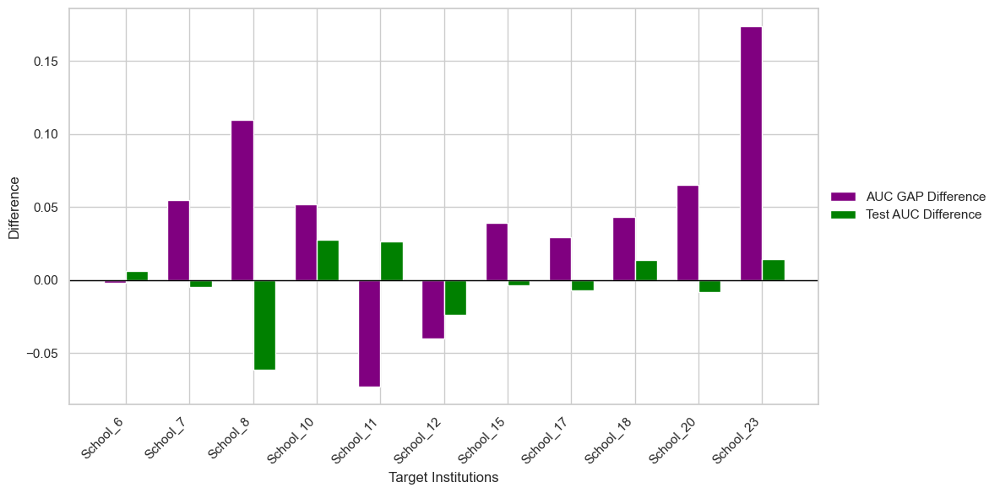

In [ ]:
#Visualization for individual institutions
auc_gap_difference = filtered_test3['auc_gap'] - filtered_test3['auc gap_sequential']
auc_score_difference = filtered_test3['auc_score'] - filtered_test3['sequential training auc score']

x_labels = filtered_test3['test_school']
x = np.arange(len(x_labels))  

bar_width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))

bar1 = ax.bar(x - bar_width/2, auc_gap_difference, bar_width, label='AUC GAP Difference',
              color='purple')

bar2 = ax.bar(x + bar_width/2, auc_score_difference, bar_width, label='Test AUC Difference',
              color='green')

ax.set_xlabel('Target Institutions')
ax.set_ylabel('Difference')
ax.set_xticks(x)
ax.set_xticklabels(x_labels, rotation=45, ha='right')

ax.axhline(0, color='black', linewidth=1)

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

plt.tight_layout()
plt.show()


In [ ]:
# Calculate Wasserstein distance for filtered_test1 (AUC GAP >= 0.0)
wd1 = wasserstein_distance(filtered_test1['auc_score'], filtered_test1['sequential training auc score'])
print(f"Wasserstein Distance for AUC score >= 0.0: {wd1}")

# Calculate Wasserstein distance for filtered_test2 (AUC GAP >= 0.5)
wd2 = wasserstein_distance(filtered_test2['auc_score'], filtered_test2['sequential training auc score'])
print(f"Wasserstein Distance for AUC score >= 0.5: {wd2}")

# Calculate Wasserstein distance for filtered_test3 (AUC GAP >= 1.0)
wd3 = wasserstein_distance(filtered_test3['auc_score'], filtered_test3['sequential training auc score'])
print(f"Wasserstein Distance for AUC score >= 1.0: {wd3}")


Wasserstein Distance for AUC score >= 0.0: 0.012775434782608683
Wasserstein Distance for AUC score >= 0.5: 0.010343176470588238
Wasserstein Distance for AUC score >= 1.0: 0.007938272727272747


In [ ]:
auc_gap_range_test1 = (filtered_test1['auc_gap'].min(), filtered_test1['auc_gap'].max())
auc_gap_sequential_range_test1 = (filtered_test1['auc gap_sequential'].min(), filtered_test1['auc gap_sequential'].max())

auc_gap_range_test2 = (filtered_test2['auc_gap'].min(), filtered_test2['auc_gap'].max())
auc_gap_sequential_range_test2 = (filtered_test2['auc gap_sequential'].min(), filtered_test2['auc gap_sequential'].max())

auc_gap_range_test3 = (filtered_test3['auc_gap'].min(), filtered_test3['auc_gap'].max())
auc_gap_sequential_range_test3 = (filtered_test3['auc gap_sequential'].min(), filtered_test3['auc gap_sequential'].max())

print(f"Filtered Test1 AUC GAP Range: {auc_gap_range_test1}")
print(f"Filtered Test1 Sequential AUC GAP Range: {auc_gap_sequential_range_test1}")
print(f"Filtered Test2 AUC GAP Range: {auc_gap_range_test2}")
print(f"Filtered Test2 Sequential AUC GAP Range: {auc_gap_sequential_range_test2}")
print(f"Filtered Test3 AUC GAP Range: {auc_gap_range_test3}")
print(f"Filtered Test3 Sequential AUC GAP Range: {auc_gap_sequential_range_test3}")

# Calculate the Wasserstein distances between AUC GAP and Sequential AUC GAP for each dataset
wasserstein_test1 = wasserstein_distance(filtered_test1['auc_gap'], filtered_test1['auc gap_sequential'])
wasserstein_test2 = wasserstein_distance(filtered_test2['auc_gap'], filtered_test2['auc gap_sequential'])
wasserstein_test3 = wasserstein_distance(filtered_test3['auc_gap'], filtered_test3['auc gap_sequential'])

print(f"Wasserstein Distance between AUC GAP and Sequential AUC GAP (Test1): {wasserstein_test1}")
print(f"Wasserstein Distance between AUC GAP and Sequential AUC GAP (Test2): {wasserstein_test2}")
print(f"Wasserstein Distance between AUC GAP and Sequential AUC GAP (Test3): {wasserstein_test3}")

Filtered Test1 AUC GAP Range: (np.float64(0.026157), np.float64(0.251736))
Filtered Test1 Sequential AUC GAP Range: (np.float64(0.004419), np.float64(0.209335))
Filtered Test2 AUC GAP Range: (np.float64(0.056476), np.float64(0.251736))
Filtered Test2 Sequential AUC GAP Range: (np.float64(0.027793), np.float64(0.209335))
Filtered Test3 AUC GAP Range: (np.float64(0.101), np.float64(0.251736))
Filtered Test3 Sequential AUC GAP Range: (np.float64(0.044104), np.float64(0.209335))
Wasserstein Distance between AUC GAP and Sequential AUC GAP (Test1): 0.025544304347826088
Wasserstein Distance between AUC GAP and Sequential AUC GAP (Test2): 0.03680970588235294
Wasserstein Distance between AUC GAP and Sequential AUC GAP (Test3): 0.041069272727272725


In [450]:
from scipy.stats import wasserstein_distance

# Assuming you have already created 'filtered_test1', 'filtered_test2', and 'filtered_test3' DataFrames.

# Calculate Wasserstein distance for filtered_test1 (AUC GAP >= 0.0)
wd1 = wasserstein_distance(filtered_test1['auc_gap'], filtered_test1['auc gap_sequential'])
print(f"Wasserstein Distance for AUC GAP >= 0.0: {wd1}")

# Calculate Wasserstein distance for filtered_test2 (AUC GAP >= 0.5)
wd2 = wasserstein_distance(filtered_test2['auc_gap'], filtered_test2['auc gap_sequential'])
print(f"Wasserstein Distance for AUC GAP >= 0.5: {wd2}")

# Calculate Wasserstein distance for filtered_test3 (AUC GAP >= 1.0)
wd3 = wasserstein_distance(filtered_test3['auc_gap'], filtered_test3['auc gap_sequential'])
print(f"Wasserstein Distance for AUC GAP >= 1.0: {wd3}")


Wasserstein Distance for AUC GAP >= 0.0: 0.025544304347826088
Wasserstein Distance for AUC GAP >= 0.5: 0.03680970588235294
Wasserstein Distance for AUC GAP >= 1.0: 0.041069272727272725


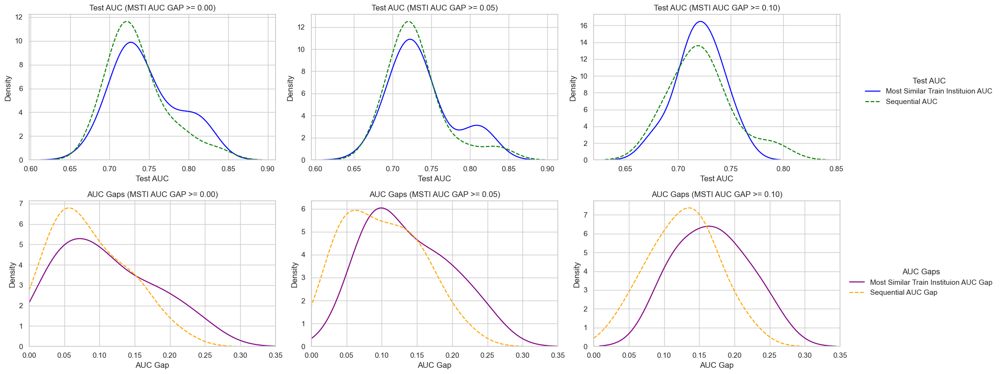

In [ ]:

fig, axes = plt.subplots(2, 3, figsize=(20, 8))
# Plot for filtered_test1 (AUC GAP >= 0.0)
sns.kdeplot(filtered_test1['auc_score'], label='Most Similar Train Instituion AUC', linestyle='-', color='blue', ax=axes[0, 0])
sns.kdeplot(filtered_test1['sequential training auc score'], label='Sequential AUC', linestyle='--', color='green', ax=axes[0, 0])
axes[0, 0].set_title('Test AUC (MSTI AUC GAP >= 0.00)')
axes[0, 0].set_xlabel('Test AUC')
axes[0, 0].set_ylabel('Density')
axes[0, 0].grid(True)

# Plot for filtered_test2 (AUC GAP >= 0.5)
sns.kdeplot(filtered_test2['auc_score'], label='Most Similar Train Instituion AUC', linestyle='-', color='blue', ax=axes[0, 1])
sns.kdeplot(filtered_test2['sequential training auc score'], label='Sequential AUC', linestyle='--', color='green', ax=axes[0, 1])
axes[0, 1].set_title('Test AUC (MSTI AUC GAP >= 0.05)')
axes[0, 1].set_xlabel('Test AUC')
axes[0, 1].set_ylabel('Density')
axes[0, 1].grid(True)

# Plot for filtered_test3 (AUC GAP >= 1.0)
sns.kdeplot(filtered_test3['auc_score'], label='Most Similar Train Instituion AUC', linestyle='-', color='blue', ax=axes[0, 2])
sns.kdeplot(filtered_test3['sequential training auc score'], label='Sequential AUC', linestyle='--', color='green', ax=axes[0, 2])
axes[0, 2].set_title('Test AUC (MSTI AUC GAP >= 0.10)')
axes[0, 2].set_xlabel('Test AUC')
axes[0, 2].set_ylabel('Density')
axes[0, 2].grid(True)

# AUC Gaps (second row)
# Plot for filtered_test1 (AUC GAP >= 0.0)
sns.kdeplot(filtered_test1['auc_gap'], label='Most Similar Train Instituion AUC Gap', linestyle='-', color='purple', ax=axes[1, 0])
sns.kdeplot(filtered_test1['auc gap_sequential'], label='Sequential AUC Gap', linestyle='--', color='orange', ax=axes[1, 0])
axes[1, 0].set_title('AUC Gaps (MSTI AUC GAP >= 0.00)')
axes[1, 0].set_xlabel('AUC Gap')
axes[1, 0].set_ylabel('Density')
axes[1, 0].set_xlim(0, 0.35)
axes[1, 0].grid(True)

# Plot for filtered_test2 (AUC GAP >= 0.5)
sns.kdeplot(filtered_test2['auc_gap'], label='Most Similar Train Instituion AUC Gap', linestyle='-', color='purple', ax=axes[1, 1])
sns.kdeplot(filtered_test2['auc gap_sequential'], label='Sequential AUC Gap', linestyle='--', color='orange', ax=axes[1, 1])
axes[1, 1].set_title('AUC Gaps (MSTI AUC GAP >= 0.05)')
axes[1, 1].set_xlabel('AUC Gap')
axes[1, 1].set_ylabel('Density')
axes[1, 1].set_xlim(0, 0.35)
axes[1, 1].grid(True)

# Plot for filtered_test3 (AUC GAP >= 1.0)
sns.kdeplot(filtered_test3['auc_gap'], label='Most Similar Train Instituion AUC Gap', linestyle='-', color='purple', ax=axes[1, 2])
sns.kdeplot(filtered_test3['auc gap_sequential'], label='Sequential AUC Gap', linestyle='--', color='orange', ax=axes[1, 2])
axes[1, 2].set_title('AUC Gaps (MSTI AUC GAP >= 0.10)')
axes[1, 2].set_xlabel('AUC Gap')
axes[1, 2].set_ylabel('Density')
axes[1, 2].set_xlim(0, 0.35)
axes[1, 2].grid(True)

handles_score, labels_score = axes[0, 0].get_legend_handles_labels()
fig.legend(handles_score, labels_score, loc='center right', bbox_to_anchor=(1.05, 0.75), title="Test AUC", frameon=False)

handles_gap, labels_gap = axes[1, 0].get_legend_handles_labels()
fig.legend(handles_gap, labels_gap, loc='center right', bbox_to_anchor=(1.05, 0.25), title="AUC Gaps", frameon=False)

plt.tight_layout(rect=[0, 0, 0.9, 1]) 
plt.show()


## RQ3

### SFDA

#### SHOT

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
from sklearn.preprocessing import StandardScaler
import numpy as np
import os
import joblib
from sklearn.metrics import roc_auc_score
import pandas as pd
import torch.optim as optim
from scipy.spatial.distance import cdist

def op_copy(optimizer):
    for param_group in optimizer.param_groups:
        param_group['lr0'] = param_group['lr']
    return optimizer

def lr_scheduler(optimizer, iter_num, max_iter, gamma=10, power=0.75):
    decay = (1 + gamma * iter_num / max_iter) ** (-power)
    for param_group in optimizer.param_groups:
        param_group['lr'] = param_group['lr0'] * decay
        param_group['weight_decay'] = 1e-3
        param_group['momentum'] = 0.9
        param_group['nesterov'] = True
    return optimizer

def obtain_label(loader, netF, netB, netC, c=None):
    start_test = True
    with torch.no_grad():
        iter_test = iter(loader)
        for _ in range(len(loader)):
            data = next(iter_test)
            inputs = data[0]
            labels = data[1]
            feas = netB(netF(inputs))
            outputs = netC(feas)
            if start_test:
                all_fea = feas.float().cpu()
                all_output = outputs.float().cpu()
                all_label = labels.float()
                start_test = False
            else:
                all_fea = torch.cat((all_fea, feas.float().cpu()), 0)
                all_output = torch.cat((all_output, outputs.float().cpu()), 0)
                all_label = torch.cat((all_label, labels.float()), 0)

    # Apply softmax to the output
    all_output = nn.Softmax(dim=1)(all_output)
    _, predict = torch.max(all_output, 1)

    # Normalize features and convert to numpy array
    all_fea = torch.cat((all_fea, torch.ones(all_fea.size(0), 1)), 1)
    all_fea = (all_fea.t() / torch.norm(all_fea, p=2, dim=1)).t()
    all_fea = all_fea.float().numpy()

    K = all_output.size(1)
    aff = all_output.float().numpy()
    
    # Calculate initial class centers
    initc = aff.transpose().dot(all_fea)
    initc = initc / (1e-8 + aff.sum(axis=0)[:, None])
    dd = cdist(all_fea, initc, 'cosine')
    pred_label = dd.argmin(axis=1)

    for round in range(1): 
        aff = np.eye(K)[pred_label]
        initc = aff.transpose().dot(all_fea)
        initc = initc / (1e-8 + aff.sum(axis=0)[:, None])
        dd = cdist(all_fea, initc, 'cosine')
        pred_label = dd.argmin(axis=1)

    return pred_label.astype('int')

In [545]:
def Entropy(input_):
    bs = input_.size(0)
    entropy = -input_ * torch.log(input_ + 1e-5)
    entropy = torch.sum(entropy, dim=1)
    return entropy 

class CrossEntropyLabelSmooth(nn.Module):
    def __init__(self, num_classes, epsilon=0.1, use_gpu=True, size_average=True):
        super(CrossEntropyLabelSmooth, self).__init__()
        self.num_classes = num_classes
        self.epsilon = epsilon
        self.use_gpu = use_gpu
        self.size_average = size_average
        self.logsoftmax = nn.LogSoftmax(dim=1)

    def forward(self, inputs, targets):
        log_probs = self.logsoftmax(inputs)
        targets = torch.zeros(log_probs.size()).scatter_(1, targets.unsqueeze(1).cpu(), 1)
        if self.use_gpu: targets = targets.cuda()
        targets = (1 - self.epsilon) * targets + self.epsilon / self.num_classes
        if self.size_average:
            loss = (- targets * log_probs).mean(0).sum()
        else:
            loss = (- targets * log_probs).sum(1)
        return loss

In [ ]:
def SHOT(school_data, source_schools, schools, cols):
    device = torch.device("cpu")
    model_save_path = 'trained_model'
    train_features = Institution[cols]

    auc_matrix_shot = pd.DataFrame(
        np.zeros((len(source_schools), len(schools))),
        index=source_schools,
        columns=schools
    )


    for i, train_school in enumerate(source_schools):
        print(f"Loading model for training school {i+1}/{len(source_schools)} ({train_school})...")


        model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
        model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
        model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
        scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

        input_dim = train_features.shape[1]
        netF = RetentionFeatureExtractor(input_dim).to(device)
        netB = RetentionBottleneck().to(device)
        netC = RetentionClassifier().to(device)

        netF.load_state_dict(torch.load(model_f_filename, map_location=device))
        netB.load_state_dict(torch.load(model_b_filename, map_location=device))
        netC.load_state_dict(torch.load(model_c_filename, map_location=device))


        netF.eval()
        netB.eval()
        netC.eval()


        scaler = joblib.load(scaler_filename)

    
        for j, test_school in enumerate(schools):
            print(f"Fine-tuning and evaluating on test school {j+1}/{len(schools)} ({test_school})...")

    
            eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
            eval_features = eval_data[cols].values
            eval_labels = eval_data['retention'].values

      
            eval_features_df = pd.DataFrame(eval_features, columns=cols) 
            eval_features_scaled = scaler.transform(eval_features_df) 

            eval_tensor = TensorDataset(
                torch.tensor(eval_features_scaled, dtype=torch.float32), 
                torch.tensor(eval_labels, dtype=torch.long)
            )
            eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=True)

            # Freeze classifier netC
            for param in netC.parameters():
                param.requires_grad = False

            # Prepare optimizer for netF and netB
            param_group = list(netF.parameters()) + list(netB.parameters())
            optimizer = optim.SGD(param_group, lr=0.001)
            optimizer = op_copy(optimizer)

            max_epoch = 10
            max_iter = max_epoch * len(eval_loader)
            interval_iter = len(eval_loader)
            iter_num = 0
            iter_eval = iter(eval_loader)
            cls_par = 0.3
            ent = True
            gent = True
            ent_par = 1.0

            while iter_num < max_iter:
                optimizer.zero_grad()
                try:
                    inputs_test, tar_idx = next(iter_eval)
                except StopIteration:
                    iter_eval = iter(eval_loader)
                    inputs_test, tar_idx = next(iter_eval)

                if inputs_test.size(0) == 1:
                    continue

                if iter_num % interval_iter == 0 and cls_par > 0:
                    netF.eval()
                    netB.eval()
                    mem_label = obtain_label(eval_loader, netF, netB, netC)
                    mem_label = torch.from_numpy(mem_label)  
                    netF.train()
                    netB.train()

                iter_num += 1
                lr_scheduler(optimizer, iter_num=iter_num, max_iter=max_iter)  
                inputs_test = inputs_test.to(device)
                features_test = netB(netF(inputs_test))
                outputs_test = netC(features_test)

                if cls_par > 0:
                    pred = mem_label[tar_idx]
                    classifier_loss = cls_par * nn.CrossEntropyLoss()(outputs_test, pred.to(device))
                else:
                    classifier_loss = torch.tensor(0.0)

                if ent:
                    softmax_out = nn.Softmax(dim=1)(outputs_test)
                    entropy_loss = torch.mean(Entropy(softmax_out))
                    if gent:
                        msoftmax = softmax_out.mean(dim=0)
                        entropy_loss -= torch.sum(-msoftmax * torch.log(msoftmax + 1e-5))

                    im_loss = entropy_loss * ent_par
                    classifier_loss += im_loss

                optimizer.zero_grad()
                classifier_loss.backward()
                optimizer.step()

            eval_predictions = []
            eval_actuals = []

            with torch.no_grad():
                for features, labels in eval_loader:
                    if features.size(0) <= 1:
                        continue 

                    features = features.to(device)

                   
                    outputs = netF(features)
                    outputs = netB(outputs)
                    outputs = netC(outputs)

                   
                    eval_predictions.extend(outputs.cpu().numpy().flatten())
                    eval_actuals.extend(labels.cpu().numpy().flatten())

        
            eval_auc_score = roc_auc_score(eval_actuals, eval_predictions)
            auc_matrix_shot.iloc[i, j] = eval_auc_score 

    print("AUC Matrix for Shot Fine-Tuning and Evaluation on Test Schools:")
    print(auc_matrix_shot)

    return auc_matrix_shot


In [ ]:
auc_matrix_shot = SHOT(school_data, source_schools, schools, cols)

Loading model for training school 1/27 (Tidewater)...
Fine-tuning and evaluating on test school 1/23 (Tidewater)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2029770728.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Fine-tuning and evaluating on test school 2/23 (Piedmont_Virginia)...
Fine-tuning and evaluating on test school 3/23 (Laurel_Ridge)...
Fine-tuning and evaluating on test school 4/23 (Brightpoint)...
Fine-tuning and evaluating on test school 5/23 (J._Sargeant_Reynolds)...
Fine-tuning and evaluating on test school 6/23 (Virginia_Western)...
Fine-tuning and evaluating on test school 7/23 (Rappahannock)...
Fine-tuning and evaluating on test school 8/23 (Patrick_Henry)...
Fine-tuning and evaluating on test school 9/23 (Northern_Virginia)...
Fine-tuning and evaluating on test school 10/23 (Southwest_Virginia)...
Fine-tuning and evaluating on test school 11/23 (Virginia_Highlands)...
Fine-tuning and evaluating on test school 12/23 (Paul_D._Camp)...
Fine-tuning and evaluating on test school 13/23 (Germanna)...
Fine-tuning and evaluating on test school 14/23 (Virginia_Peninsula)...
Fine-tuning and evaluating on test school 15/23 (Central_Virginia)...
Fine-tuning and evaluating on test school 16

#### Tent

In [550]:
import importlib
import tent 
importlib.reload(tent)

<module 'tent' from '/Users/ycy/Desktop/LAK2025/Transfer_Learning_Model_Training_903/tent.py'>

In [ ]:

device = torch.device("mps")


class CombinedRetentionModel(nn.Module):
    def __init__(self, input_dim):
        super(CombinedRetentionModel, self).__init__()
        self.netF = RetentionFeatureExtractor(input_dim).to(device)
        self.netB = RetentionBottleneck().to(device)
        self.netC = RetentionClassifier().to(device)

    def forward(self, x):
        features = self.netF(x)
        bottleneck_output = self.netB(features)
        outputs = self.netC(bottleneck_output)
        return outputs


model_save_path = 'trained_model'

train_features = Institution[cols] 


auc_scores_tent = []


for i, train_school in enumerate(source_schools):
    print(f"Loading model for training school {i+1}/{len(source_schools)} ({train_school})...")
    model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
    model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
    model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
    scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

    combined_model = CombinedRetentionModel(train_features.shape[1]).to(device)

    combined_model.netF.load_state_dict(torch.load(model_f_filename, map_location=device))
    combined_model.netB.load_state_dict(torch.load(model_b_filename, map_location=device))
    combined_model.netC.load_state_dict(torch.load(model_c_filename, map_location=device))

    combined_model.eval()


    scaler = joblib.load(scaler_filename)

    # Configure TENT for the combined model
    tent.configure_model(combined_model)

    params, param_names = tent.collect_params(combined_model)


    if not params:
        raise ValueError("No parameters found for optimization. Check the model configuration and parameter collection.")

    tent_optimizer = optim.Adam(params, lr=0.0001)  

    tent_model = tent.Tent(combined_model, tent_optimizer)

    for j, test_school in enumerate(schools):
        print(f"Evaluating TENT on test school {j+1}/{len(schools)} ({test_school})...")

     
        test_features = school_data[test_school][cols]
        test_labels = school_data[test_school]['retention']
        test_features = scaler.transform(test_features) 
        test_tensor = TensorDataset(torch.tensor(test_features, dtype=torch.float32), 
                                    torch.tensor(test_labels.values, dtype=torch.float32).view(-1, 1))
        test_loader = DataLoader(test_tensor, batch_size=32, shuffle=False)

        tent_model.model.eval()

        predictions = []
        actuals = []
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            if inputs.size(0) <= 1:

                continue

            # Perform adaptation with TENT
            with torch.enable_grad():  
                tent_model.model.train()  
                outputs = tent_model(inputs)  
                tent_model.model.eval()  

            with torch.no_grad():
                outputs = tent_model(inputs)
                predicted_probs = outputs.squeeze(-1)
                predictions.extend(predicted_probs.cpu().numpy())
                actuals.extend(labels.cpu().numpy())

       
        auc_score = roc_auc_score(actuals, predictions)
        auc_scores_tent.append((train_school, test_school, auc_score))

print("AUC scores for each training and test school pair after TENT adaptation:")
for result in auc_scores_tent:
    print(f"Train school: {result[0]}, Test school: {result[1]}, AUC Score: {result[2]}")


Loading model for training school 1/27 (Tidewater)...
Evaluating TENT on test school 1/23 (Tidewater)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3786471293.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  combined_model.netF.load_state_dict(torch.loa

Evaluating TENT on test school 2/23 (Piedmont_Virginia)...
Evaluating TENT on test school 3/23 (Laurel_Ridge)...
Evaluating TENT on test school 4/23 (Brightpoint)...
Evaluating TENT on test school 5/23 (J._Sargeant_Reynolds)...
Evaluating TENT on test school 6/23 (Virginia_Western)...
Evaluating TENT on test school 7/23 (Rappahannock)...
Evaluating TENT on test school 8/23 (Patrick_Henry)...
Evaluating TENT on test school 9/23 (Northern_Virginia)...
Evaluating TENT on test school 10/23 (Southwest_Virginia)...
Evaluating TENT on test school 11/23 (Virginia_Highlands)...
Evaluating TENT on test school 12/23 (Paul_D._Camp)...
Evaluating TENT on test school 13/23 (Germanna)...
Evaluating TENT on test school 14/23 (Virginia_Peninsula)...
Evaluating TENT on test school 15/23 (Central_Virginia)...
Evaluating TENT on test school 16/23 (Southside_Virginia)...
Evaluating TENT on test school 17/23 (Eastern_Shore)...
Evaluating TENT on test school 18/23 (Mountain_Empire)...
Evaluating TENT on test

In [ ]:
df_auc = pd.DataFrame(auc_scores_tent, columns=['Train School', 'Test School', 'AUC Score'])

df_auc['Train School'] = pd.Categorical(df_auc['Train School'], ordered=True, categories=df_auc['Train School'].unique())
df_auc['Test School'] = pd.Categorical(df_auc['Test School'], ordered=True, categories=df_auc['Test School'].unique())

auc_matrix_tent = df_auc.pivot(index='Train School', columns='Test School', values='AUC Score')
auc_matrix_tent.index.name = None
auc_matrix_tent.columns.name = None
auc_matrix_tent

,Tidewater,Piedmont_Virginia,Laurel_Ridge,Brightpoint,J._Sargeant_Reynolds,Virginia_Western,Rappahannock,Patrick_Henry,Northern_Virginia,Southwest_Virginia,...,Virginia_Peninsula,Central_Virginia,Southside_Virginia,Eastern_Shore,Mountain_Empire,Wytheville,Danville,New_River,Blue_Ridge,Mountain_Gateway
Tidewater,0.762679,0.690166,0.690639,0.690214,0.758861,0.683563,0.682599,0.675540,0.741415,0.675222,...,0.714044,0.676412,0.687372,0.698817,0.676290,0.690626,0.689708,0.696372,0.735766,0.688918
Piedmont_Virginia,0.690065,0.666429,0.588990,0.566443,0.516833,0.465862,0.440668,0.465855,0.436964,0.431981,...,0.435261,0.441630,0.425560,0.446825,0.435480,0.428781,0.424331,0.423612,0.424761,0.434872
Laurel_Ridge,0.674228,0.679943,0.703916,0.661373,0.700466,0.679674,0.688806,0.664885,0.693141,0.685605,...,0.660365,0.683914,0.691658,0.686595,0.685674,0.694053,0.691990,0.711074,0.693502,0.678383
Brightpoint,0.700842,0.646660,0.558795,0.464907,0.413281,0.414873,0.404143,0.437660,0.360197,0.426914,...,0.372666,0.402095,0.420041,0.414978,0.441807,0.402026,0.406731,0.376339,0.373957,0.398194
J._Sargeant_Reynolds,0.726464,0.682778,0.648608,0.591395,0.601058,0.533423,0.516576,0.548419,0.510747,0.493402,...,0.488604,0.496690,0.525643,0.512212,0.511004,0.489326,0.506919,0.469680,0.501508,0.505760
Virginia_Western,0.692397,0.680098,0.640170,0.665725,0.709429,0.639484,0.616071,0.613535,0.672099,0.549214,...,0.629883,0.592745,0.575130,0.587098,0.536912,0.568509,0.567716,0.606078,0.634831,0.598197
Rappahannock,0.647419,0.661857,0.670875,0.631163,0.663231,0.650805,0.665615,0.648361,0.588895,0.620196,...,0.522548,0.591700,0.642005,0.594316,0.641757,0.610295,0.621180,0.598352,0.571839,0.580172
Patrick_Henry,0.657870,0.636452,0.656305,0.630201,0.677210,0.642623,0.642322,0.670021,0.662844,0.619640,...,0.645948,0.641198,0.627487,0.633697,0.622356,0.641864,0.641341,0.661476,0.668368,0.626645
Northern_Virginia,0.751589,0.684478,0.666682,0.671432,0.739635,0.650835,0.650784,0.652813,0.700852,0.606998,...,0.633879,0.611747,0.625773,0.620717,0.607306,0.632849,0.627678,0.627011,0.659869,0.628045
Southwest_Virginia,0.598074,0.601907,0.634492,0.582248,0.608335,0.604475,0.613557,0.632015,0.507635,0.619684,...,0.505123,0.568663,0.600810,0.553126,0.626650,0.591923,0.584418,0.568518,0.521282,0.559491


#### Psuedo_labeling

In [ ]:
device = torch.device("mps")
model_save_path = 'trained_model'
train_features = Institution[cols]

auc_matrix_pseudo = pd.DataFrame(index=source_schools, columns=schools)

for i, train_school in enumerate(source_schools):
    print(f"Loading model for training school {i+1}/{len(schools)} ({train_school})...")

    model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
    model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
    model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
    scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

    input_dim = train_features.shape[1]
    netF = RetentionFeatureExtractor(input_dim).to(device)
    netB = RetentionBottleneck().to(device)
    netC = RetentionClassifier().to(device)

    netF.load_state_dict(torch.load(model_f_filename, map_location=device))
    netB.load_state_dict(torch.load(model_b_filename, map_location=device))
    netC.load_state_dict(torch.load(model_c_filename, map_location=device))

    netF.eval()
    netB.eval()
    netC.eval()

    scaler = joblib.load(scaler_filename)

    for j, test_school in enumerate(schools):

        eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
        eval_features = eval_data[cols].values
        eval_labels = eval_data['retention'].values

        
        eval_features_df = pd.DataFrame(eval_features, columns=cols)  
        eval_features_scaled = scaler.transform(eval_features_df) 

        eval_tensor = TensorDataset(
            torch.tensor(eval_features_scaled, dtype=torch.float32), 
            torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
        )

        eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)

        pseudo_labels = []
        eval_predictions = []
        with torch.no_grad():
            for features, _ in eval_loader:
                if features.size(0) <= 1:
                    continue  

                features = features.to(device)

                outputs = netF(features)
                outputs = netB(outputs)
                outputs = netC(outputs)
                eval_predictions.extend(outputs.cpu().numpy().flatten())
                pseudo_labels.extend((outputs.cpu().numpy() > 0.5).astype(int).flatten())  # Binary pseudo-labeling

        pseudo_labels_tensor = torch.tensor(pseudo_labels, dtype=torch.float32).view(-1, 1)
        pseudo_tensor = TensorDataset(torch.tensor(eval_features_scaled, dtype=torch.float32), pseudo_labels_tensor)

        pseudo_loader = DataLoader(pseudo_tensor, batch_size=32, shuffle=True)

        netF.train()
        netB.train()
        netC.train()

        optimizer_f = torch.optim.Adam(netF.parameters(), lr=1e-4)
        optimizer_b = torch.optim.Adam(netB.parameters(), lr=1e-4)
        optimizer_c = torch.optim.Adam(netC.parameters(), lr=1e-4)

        num_epochs = 5
        for epoch in range(num_epochs):
            for features, labels in pseudo_loader:
                features, labels = features.to(device), labels.to(device)

    
                optimizer_f.zero_grad()
                optimizer_b.zero_grad()
                optimizer_c.zero_grad()

                outputs = netF(features)
                outputs = netB(outputs)
                outputs = netC(outputs)

                loss = torch.nn.BCELoss()(outputs, labels)

                loss.backward()
                optimizer_f.step()
                optimizer_b.step()
                optimizer_c.step()

        netF.eval()
        netB.eval()
        netC.eval()

        eval_actuals = []
        eval_predictions_finetuned = []
        with torch.no_grad():
            for features, labels in eval_loader:
                if features.size(0) <= 1:
                    continue  

                features = features.to(device)

                outputs = netF(features)
                outputs = netB(outputs)
                outputs = netC(outputs)

                eval_predictions_finetuned.extend(outputs.cpu().numpy().flatten())
                eval_actuals.extend(labels.cpu().numpy().flatten())

        eval_auc_score_finetuned = roc_auc_score(eval_actuals, eval_predictions_finetuned)
        auc_matrix_pseudo.iloc[i, j] = eval_auc_score_finetuned  

print("AUC Matrix for Fine-Tuned Model Evaluation with Pseudo-Labeling:")
print(auc_matrix_pseudo)


Loading model for training school 1/23 (Tidewater)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 2/23 (Piedmont_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 3/23 (Laurel_Ridge)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 4/23 (Brightpoint)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 5/23 (J._Sargeant_Reynolds)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 6/23 (Virginia_Western)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 7/23 (Rappahannock)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 8/23 (Patrick_Henry)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 9/23 (Northern_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 10/23 (Southwest_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 11/23 (Virginia_Highlands)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 12/23 (Paul_D._Camp)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 13/23 (Germanna)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 14/23 (Virginia_Peninsula)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 15/23 (Central_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 16/23 (Southside_Virginia)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 17/23 (Eastern_Shore)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 18/23 (Mountain_Empire)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 19/23 (Wytheville)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 20/23 (Danville)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 21/23 (New_River)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 22/23 (Blue_Ridge)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 23/23 (Mountain_Gateway)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 24/23 (uci)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 25/23 (asuo)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 26/23 (asu)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school 27/23 (um)...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/1060918964.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

AUC Matrix for Fine-Tuned Model Evaluation with Pseudo-Labeling:
                     Tidewater Piedmont_Virginia Laurel_Ridge Brightpoint  \
Tidewater             0.792303          0.675723     0.617156    0.645798   
Piedmont_Virginia     0.767607          0.696477     0.665505    0.681845   
Laurel_Ridge          0.762737          0.695547     0.706028    0.688936   
Brightpoint           0.776375          0.705606     0.675339    0.689546   
J._Sargeant_Reynolds  0.775254          0.689386     0.637296    0.653592   
Virginia_Western      0.762186          0.700764     0.703992     0.69911   
Rappahannock          0.717528          0.691095      0.70484    0.671884   
Patrick_Henry         0.737695          0.671476     0.684881    0.682197   
Northern_Virginia     0.784752          0.686153     0.602744    0.618005   
Southwest_Virginia    0.619028          0.645976     0.666356    0.597566   
Virginia_Highlands    0.676716          0.635422     0.696997     0.63231   
Paul_D._Cam

#### Comparison

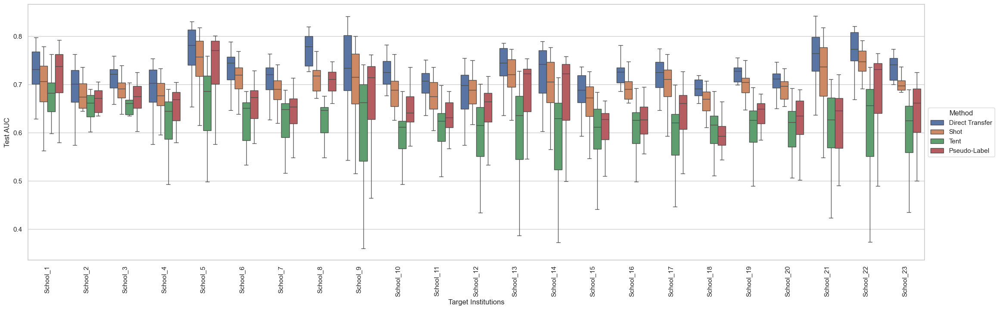

In [ ]:

name_mapping = dict(zip(match_df['Institutions'], match_df['Deidentified_Name']))

def deidentify_matrix(matrix, name_mapping):
    matrix_copy = matrix.copy()
    matrix_copy.columns = [name_mapping.get(col, col) for col in matrix.columns]
    matrix_copy.index = [name_mapping.get(index, index) for index in matrix.index]
    return matrix_copy


auc_matrix_tent = deidentify_matrix(auc_matrix_tent, name_mapping)
auc_matrix_shot = deidentify_matrix(auc_matrix_shot, name_mapping)
auc_matrix_direct = deidentify_matrix(auc_matrix_direct, name_mapping)
auc_matrix_pseudo = deidentify_matrix(auc_matrix_pseudo, name_mapping)

df_tent = auc_matrix_tent.melt(ignore_index=False, var_name='Test School', value_name='AUC')
df_tent['Type'] = 'Tent'

df_shot = auc_matrix_shot.melt(ignore_index=False, var_name='Test School', value_name='AUC')
df_shot['Type'] = 'Shot'

df_direct = auc_matrix_direct.melt(ignore_index=False, var_name='Test School', value_name='AUC')
df_direct['Type'] = 'Direct Transfer'

df_pseudo = auc_matrix_pseudo.melt(ignore_index=False, var_name='Test School', value_name='AUC')
df_pseudo['Type'] = 'Pseudo-Label'

df_combined = pd.concat([df_tent, df_shot, df_direct, df_pseudo])

df_combined.reset_index(inplace=True)
df_combined.rename(columns={'index': 'Train School'}, inplace=True)

method_order = ['Direct Transfer', 'Shot', 'Tent', 'Pseudo-Label']

plt.figure(figsize=(24, 8))  


plt.xticks(rotation=90)

ax = sns.boxplot(x='Test School', y='AUC', hue='Type', data=df_combined, 
                 order=df_combined['Test School'].unique(), hue_order=method_order, showfliers=False)

ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticklabels(), ha='center')

ax.set_xlabel('Target Institutions', fontsize=12)
ax.set_ylabel('Test AUC', fontsize=12)


plt.legend(title='Method', loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout(pad=3.0)
plt.show()


### Threshold Techniques

In [ ]:
#Performance with overall optimal threshold
device = torch.device("cpu")
model_save_path = 'trained_model'
train_features = Institution[cols]

results = []

for test_school in schools:
    print(f"Evaluating test school {test_school}...")
    retention_data = school_data[test_school][(school_data[test_school]['year'] >= 2012) & (school_data[test_school]['year'] <= 2018)]
    test_school_retention_rate = np.mean(retention_data['retention'].values)

    for train_school in source_schools:
        print(f"Loading model for training school {train_school}...")

        model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
        model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
        model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
        scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

        input_dim = train_features.shape[1]
        netF = RetentionFeatureExtractor(input_dim).to(device)
        netB = RetentionBottleneck().to(device)
        netC = RetentionClassifier().to(device)
        netF.load_state_dict(torch.load(model_f_filename, map_location=device))
        netB.load_state_dict(torch.load(model_b_filename, map_location=device))
        netC.load_state_dict(torch.load(model_c_filename, map_location=device))

        netF.eval()
        netB.eval()
        netC.eval()

        scaler = joblib.load(scaler_filename)
        eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
        eval_features = eval_data[cols].values
        eval_labels = eval_data['retention'].values

        eval_features_scaled = scaler.transform(eval_features)

        eval_tensor = TensorDataset(
            torch.tensor(eval_features_scaled, dtype=torch.float32),
            torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
        )

        eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)


        eval_predictions = []
        eval_actuals = []


        with torch.no_grad():
            for features, labels in eval_loader:
                if features.size(0) <= 1:
                    continue  

                features = features.to(device)

                outputs = netF(features)
                outputs = netB(outputs)
                outputs = netC(outputs)

                eval_predictions.extend(outputs.cpu().numpy().flatten())
                eval_actuals.extend(labels.cpu().numpy().flatten())

        # Find the threshold that matches the historical retention rate
        sorted_predictions = np.sort(eval_predictions)
        cutoff_index = int((1 - test_school_retention_rate) * len(sorted_predictions))
        optimal_threshold = sorted_predictions[cutoff_index] if len(sorted_predictions) > 0 else 0.5

        # Predict classes at the optimal threshold
        predicted_classes_optimal = (np.array(eval_predictions) > optimal_threshold).astype(int)

        # Predict classes at the default threshold (0.5)
        predicted_classes_default = (np.array(eval_predictions) > 0.5).astype(int)

        tn_opt, fp_opt, fn_opt, tp_opt = confusion_matrix(eval_actuals, predicted_classes_optimal).ravel()

        specificity_optimal = tn_opt / (tn_opt + fp_opt)

        tn_default, fp_default, fn_default, tp_default = confusion_matrix(eval_actuals, predicted_classes_default).ravel()

        specificity_default = tn_default / (tn_default + fp_default)

        f1_optimal = f1_score(eval_actuals, predicted_classes_optimal)
        mcc_optimal = matthews_corrcoef(eval_actuals, predicted_classes_optimal)

        f1_default = f1_score(eval_actuals, predicted_classes_default)
        mcc_default = matthews_corrcoef(eval_actuals, predicted_classes_default)

        results.append({
            'train school': train_school,
            'test school': test_school,
            'optimal threshold mcc': mcc_optimal,
            'optimal threshold f1': f1_optimal,
            'default mcc': mcc_default,
            'default f1': f1_default,
            'specificity optimal': specificity_optimal,
            'specificity default': specificity_default,
            'optimal threshold value': optimal_threshold
        })

results_df = pd.DataFrame(results)


NameError: name 'torch' is not defined

In [ ]:
# EO socres for using overall optimal threshold
device = torch.device("cpu")
model_save_path = 'trained_model'
train_features = Institution[cols]


demographic_groups = {
    'male': {'sex': 'Male'},
    'female': {'sex': 'Female'},
    'urm': {'urm_status': 1},
    'non_urm': {'urm_status': 0}  
}


eo_scores = []

for test_school in schools:  
    print(f"Evaluating test school {test_school}...")


    retention_data = school_data[test_school][(school_data[test_school]['year'] >= 2012) & (school_data[test_school]['year'] <= 2018)]
    test_school_retention_rate = np.mean(retention_data['retention'].values)


    eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
    eval_features = eval_data[cols].values
    eval_labels = eval_data['retention'].values


    for train_school in source_schools:
        print(f"Loading model for training school {train_school}...")

 
        model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
        model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
        model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
        scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

        input_dim = train_features.shape[1]
        netF = RetentionFeatureExtractor(input_dim).to(device)
        netB = RetentionBottleneck().to(device)
        netC = RetentionClassifier().to(device)

        netF.load_state_dict(torch.load(model_f_filename, map_location=device))
        netB.load_state_dict(torch.load(model_b_filename, map_location=device))
        netC.load_state_dict(torch.load(model_c_filename, map_location=device))

        netF.eval()
        netB.eval()
        netC.eval()

 
        scaler = joblib.load(scaler_filename)


        eval_features_scaled = scaler.transform(eval_features)

        eval_tensor = TensorDataset(
            torch.tensor(eval_features_scaled, dtype=torch.float32),
            torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
        )
        eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)

        eval_predictions = []
        eval_actuals = []

        with torch.no_grad():
            for features, labels in eval_loader:
                if features.size(0) <= 1:
                    continue 

                outputs = netF(features.to(device))
                outputs = netB(outputs)
                outputs = netC(outputs)

                eval_predictions.extend(outputs.cpu().numpy().flatten())
                eval_actuals.extend(labels.cpu().numpy().flatten())

        # Find the optimal threshold based on the test school's historical retention rate
        sorted_predictions = np.sort(eval_predictions)
        cutoff_index = int((1 - test_school_retention_rate) * len(sorted_predictions))
        optimal_threshold = sorted_predictions[cutoff_index] if len(sorted_predictions) > 0 else 0.5

        # Apply both default threshold (0.5) and optimal threshold for each demographic group
        for group_name, group_filter in demographic_groups.items():
            group_data = eval_data[eval_data[list(group_filter.keys())[0]] == list(group_filter.values())[0]]
            
            if len(group_data) == 0:
                continue 
            group_features_scaled = scaler.transform(group_data[cols].values)
            group_labels = group_data['retention'].values
            group_tensor = TensorDataset(
                torch.tensor(group_features_scaled, dtype=torch.float32),
                torch.tensor(group_labels, dtype=torch.float32).view(-1, 1)
            )
            group_loader = DataLoader(group_tensor, batch_size=32, shuffle=False)

            group_predictions = []
            group_actuals = []

            with torch.no_grad():
                for group_features, group_labels in group_loader:
                    outputs = netF(group_features.to(device))
                    outputs = netB(outputs)
                    outputs = netC(outputs)

                    group_predictions.extend(outputs.cpu().numpy().flatten())
                    group_actuals.extend(group_labels.cpu().numpy().flatten())

            predicted_classes_default = (np.array(group_predictions) > 0.5).astype(int)
            predicted_classes_optimal = (np.array(group_predictions) > optimal_threshold).astype(int)

            tn_default, fp_default, fn_default, tp_default = confusion_matrix(group_actuals, predicted_classes_default).ravel()

            tn_optimal, fp_optimal, fn_optimal, tp_optimal = confusion_matrix(group_actuals, predicted_classes_optimal).ravel()

            # Calculate TPR and TNR for default threshold
            tpr_default = tp_default / (tp_default + fn_default) if (tp_default + fn_default) > 0 else 0
            tnr_default = tn_default / (tn_default + fp_default) if (tn_default + fp_default) > 0 else 0

            # Calculate TPR and TNR for optimal threshold
            tpr_optimal = tp_optimal / (tp_optimal + fn_optimal) if (tp_optimal + fn_optimal) > 0 else 0
            tnr_optimal = tn_optimal / (tn_optimal + fp_optimal) if (tn_optimal + fp_optimal) > 0 else 0

            eo_scores.append({
                'train school': train_school,
                'test school': test_school,
                'group': group_name,
                'tpr_default': tpr_default,
                'tnr_default': tnr_default,
                'tpr_optimal': tpr_optimal,
                'tnr_optimal': tnr_optimal,
                'optimal_threshold': optimal_threshold,
                'default_threshold': 0.5
            })

eo_scores_df = pd.DataFrame(eo_scores)

# Calculate EO score by averaging the difference in TPR and TNR between groups
final_eo_scores = []
groups_to_compare = [('male', 'female'), ('urm', 'non_urm')]

for train_school in source_schools:
    for test_school in schools:
        for group1, group2 in groups_to_compare:
            group1_data = eo_scores_df[(eo_scores_df['train school'] == train_school) & (eo_scores_df['test school'] == test_school) & (eo_scores_df['group'] == group1)].iloc[0]
            group2_data = eo_scores_df[(eo_scores_df['train school'] == train_school) & (eo_scores_df['test school'] == test_school) & (eo_scores_df['group'] == group2)].iloc[0]

            # Calculate the EO score for the default threshold
            tpr_diff_default = abs(group1_data['tpr_default'] - group2_data['tpr_default'])
            tnr_diff_default = abs(group1_data['tnr_default'] - group2_data['tnr_default'])
            eo_score_default = (tpr_diff_default + tnr_diff_default) / 2

            # Calculate the EO score for the optimal threshold
            tpr_diff_optimal = abs(group1_data['tpr_optimal'] - group2_data['tpr_optimal'])
            tnr_diff_optimal = abs(group1_data['tnr_optimal'] - group2_data['tnr_optimal'])
            eo_score_optimal = (tpr_diff_optimal + tnr_diff_optimal) / 2

            final_eo_scores.append({
                'train school': train_school,
                'test school': test_school,
                'group comparison': f'{group1} vs {group2}',
                'eo score_default': eo_score_default,
                'eo score_optimal': eo_score_optimal
            })

final_eo_scores_df_overall = pd.DataFrame(final_eo_scores)


Evaluating test school Tidewater...
Loading model for training school Tidewater...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Piedmont_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school J._Sargeant_Reynolds...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Rappahannock...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Northern_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Highlands...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southside_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Mountain_Empire...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Danville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school uci...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating test school Piedmont_Virginia...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school New_River...
Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school um...
Evaluating test school Laurel_Ridge...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Danville...
Loading model for training school New_River...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school uci...
Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asu...
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating test school Brightpoint...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Piedmont_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Laurel_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Rappahannock...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Germanna...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Empire...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating test school J._Sargeant_Reynolds...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Wytheville...
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school New_River...
Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Gateway...
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school asuo...
Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school um...
Evaluating test school Virginia_Western...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Danville...
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school uci...
Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school asu...
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating test school Rappahannock...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school New_River...
Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school asu...
Loading model for training school um...
Evaluating test school Patrick_Henry...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...
Evaluating test school Northern_Virginia...
Loading model for training school Tidewater...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Piedmont_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school J._Sargeant_Reynolds...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Western...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Rappahannock...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Patrick_Henry...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Northern_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Highlands...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Paul_D._Camp...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Peninsula...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southside_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Eastern_Shore...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Empire...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Wytheville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Danville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school New_River...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Gateway...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school uci...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating test school Southwest_Virginia...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...
Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...
Evaluating test school Virginia_Highlands...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Danville...
Loading model for training school New_River...
Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school asu...
Loading model for training school um...
Evaluating test school Paul_D._Camp...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...
Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...
Evaluating test school Germanna...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Danville...
Loading model for training school New_River...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school uci...
Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asu...
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating test school Virginia_Peninsula...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Wytheville...
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school New_River...
Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Mountain_Gateway...
Loading model for training school uci...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asuo...
Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...
Evaluating test school Central_Virginia...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school New_River...
Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...
Evaluating test school Southside_Virginia...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...
Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...
Evaluating test school Eastern_Shore...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netB.load_state_dict(torch.load(model_b_filen

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...
Evaluating test school Mountain_Empire...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating test school Wytheville...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...
Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...
Evaluating test school Danville...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school um...
Evaluating test school New_River...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...
Loading model for training school J._Sargeant_Reynolds...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Paul_D._Camp...
Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Danville...
Loading model for training school New_River...
Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asu...
Loading model for training school um...
Evaluating test school Blue_Ridge...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Wytheville...
Loading model for training school Danville...
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...
Evaluating test school Mountain_Gateway...
Loading model for training school Tidewater...
Loading model for training school Piedmont_Virginia...
Loading model for training school Laurel_Ridge...
Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school J._Sargeant_Reynolds...
Loading model for training school Virginia_Western...
Loading model for training school Rappahannock...
Loading model for training school Patrick_Henry...
Loading model for training school Northern_Virginia...
Loading model for training school Southwest_Virginia...
Loading model for training school Virginia_Highlands...
Loading model for training school Paul_D._Camp...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Germanna...
Loading model for training school Virginia_Peninsula...
Loading model for training school Central_Virginia...
Loading model for training school Southside_Virginia...
Loading model for training school Eastern_Shore...
Loading model for training school Mountain_Empire...
Loading model for training school Wytheville...
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school New_River...
Loading model for training school Blue_Ridge...
Loading model for training school Mountain_Gateway...
Loading model for training school uci...
Loading model for training school asuo...
Loading model for training school asu...
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3085225311.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

In [ ]:

# Calculate Wasserstein distance for Male vs Female
male_female_wd_default_vs_optimal = wasserstein_distance(
    male_female_data['eo score_default'], male_female_data['eo score_optimal']
)
male_female_wd_default_vs_overall_optimal = wasserstein_distance(
    male_female_data['eo score_default'], male_female_data['eo score_optimal_overall']
)
male_female_wd_optimal_vs_overall_optimal = wasserstein_distance(
    male_female_data['eo score_optimal'], male_female_data['eo score_optimal_overall']
)

# Calculate Wasserstein distance for URM vs Non-URM
urm_non_urm_wd_default_vs_optimal = wasserstein_distance(
    urm_non_urm_data['eo score_default'], urm_non_urm_data['eo score_optimal']
)
urm_non_urm_wd_default_vs_overall_optimal = wasserstein_distance(
    urm_non_urm_data['eo score_default'], urm_non_urm_data['eo score_optimal_overall']
)
urm_non_urm_wd_optimal_vs_overall_optimal = wasserstein_distance(
    urm_non_urm_data['eo score_optimal'], urm_non_urm_data['eo score_optimal_overall']
)

print(f"Male vs Female - Default vs Group Optimal Wasserstein Distance: {male_female_wd_default_vs_optimal}")
print(f"Male vs Female - Default vs Overall Optimal Wasserstein Distance: {male_female_wd_default_vs_overall_optimal}")
print(f"Male vs Female - Group Optimal vs Overall Optimal Wasserstein Distance: {male_female_wd_optimal_vs_overall_optimal}")

print(f"URM vs Non-URM - Default vs Group Optimal Wasserstein Distance: {urm_non_urm_wd_default_vs_optimal}")
print(f"URM vs Non-URM - Default vs Overall Optimal Wasserstein Distance: {urm_non_urm_wd_default_vs_overall_optimal}")
print(f"URM vs Non-URM - Group Optimal vs Overall Optimal Wasserstein Distance: {urm_non_urm_wd_optimal_vs_overall_optimal}")


Male vs Female - Default vs Group Optimal Wasserstein Distance: 0.029876099153704594
Male vs Female - Default vs Overall Optimal Wasserstein Distance: 0.005849489260542497
Male vs Female - Group Optimal vs Overall Optimal Wasserstein Distance: 0.03394242389856857
URM vs Non-URM - Default vs Group Optimal Wasserstein Distance: 0.05780995963283106
URM vs Non-URM - Default vs Overall Optimal Wasserstein Distance: 0.022774112338019858
URM vs Non-URM - Group Optimal vs Overall Optimal Wasserstein Distance: 0.0805620448491324


In [ ]:
#EO using group-specific optimal thresholds
device = torch.device("cpu")
model_save_path = 'trained_model'
train_features = Institution[cols]

demographic_groups = {
    'male': {'sex': 'Male'},
    'female': {'sex': 'Female'},
    'urm': {'urm_status': 1},
    'non_urm': {'urm_status': 0}  
}
eo_scores = []


for test_school in schools:  
    print(f"Evaluating test school {test_school}...")

  
    eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
    eval_features = eval_data[cols].values
    eval_labels = eval_data['retention'].values


    for train_school in source_schools:
        print(f"Loading model for training school {train_school}...")

        model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
        model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
        model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
        scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")


        input_dim = train_features.shape[1]
        netF = RetentionFeatureExtractor(input_dim).to(device)
        netB = RetentionBottleneck().to(device)
        netC = RetentionClassifier().to(device)

        netF.load_state_dict(torch.load(model_f_filename, map_location=device))
        netB.load_state_dict(torch.load(model_b_filename, map_location=device))
        netC.load_state_dict(torch.load(model_c_filename, map_location=device))

        netF.eval()
        netB.eval()
        netC.eval()


        scaler = joblib.load(scaler_filename)

        eval_features_scaled = scaler.transform(eval_features)

        eval_tensor = TensorDataset(
            torch.tensor(eval_features_scaled, dtype=torch.float32),
            torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
        )
        eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)

        eval_predictions = []
        eval_actuals = []


        with torch.no_grad():
            for features, labels in eval_loader:
                if features.size(0) <= 1:
                    continue  

                outputs = netF(features.to(device))
                outputs = netB(outputs)
                outputs = netC(outputs)

                eval_predictions.extend(outputs.cpu().numpy().flatten())
                eval_actuals.extend(labels.cpu().numpy().flatten())

        for group_name, group_filter in demographic_groups.items():
            print(f"Evaluating group: {group_name}")

            # Historical retention rate for the specific demographic group (2012-2018)
            retention_data = school_data[test_school][(school_data[test_school]['year'] >= 2012) & 
                                                     (school_data[test_school]['year'] <= 2018) &
                                                     (school_data[test_school][list(group_filter.keys())[0]] == list(group_filter.values())[0])]
            group_retention_rate = np.mean(retention_data['retention'].values)

            group_data = eval_data[eval_data[list(group_filter.keys())[0]] == list(group_filter.values())[0]]
            
            if len(group_data) == 0:
                continue 

            group_features_scaled = scaler.transform(group_data[cols].values)
            group_labels = group_data['retention'].values

            group_tensor = TensorDataset(
                torch.tensor(group_features_scaled, dtype=torch.float32),
                torch.tensor(group_labels, dtype=torch.float32).view(-1, 1)
            )
            group_loader = DataLoader(group_tensor, batch_size=32, shuffle=False)

            group_predictions = []
            group_actuals = []

            with torch.no_grad():
                for group_features, group_labels in group_loader:
                    outputs = netF(group_features.to(device))
                    outputs = netB(outputs)
                    outputs = netC(outputs)

                    group_predictions.extend(outputs.cpu().numpy().flatten())
                    group_actuals.extend(group_labels.cpu().numpy().flatten())

            sorted_group_predictions = np.sort(group_predictions)
            cutoff_index = int((1 - group_retention_rate) * len(sorted_group_predictions))
            optimal_threshold = sorted_group_predictions[cutoff_index] if len(sorted_group_predictions) > 0 else 0.5

            predicted_classes_default = (np.array(group_predictions) > 0.5).astype(int)
            predicted_classes_optimal = (np.array(group_predictions) > optimal_threshold).astype(int)

            tn_default, fp_default, fn_default, tp_default = confusion_matrix(group_actuals, predicted_classes_default).ravel()

            tn_optimal, fp_optimal, fn_optimal, tp_optimal = confusion_matrix(group_actuals, predicted_classes_optimal).ravel()

            tpr_default = tp_default / (tp_default + fn_default) if (tp_default + fn_default) > 0 else 0
            tnr_default = tn_default / (tn_default + fp_default) if (tn_default + fp_default) > 0 else 0

            tpr_optimal = tp_optimal / (tp_optimal + fn_optimal) if (tp_optimal + fn_optimal) > 0 else 0
            tnr_optimal = tn_optimal / (tn_optimal + fp_optimal) if (tn_optimal + fp_optimal) > 0 else 0

            eo_scores.append({
                'train school': train_school,
                'test school': test_school,
                'group': group_name,
                'tpr_default': tpr_default,
                'tnr_default': tnr_default,
                'tpr_optimal': tpr_optimal,
                'tnr_optimal': tnr_optimal,
                'optimal_threshold': optimal_threshold,
                'default_threshold': 0.5
            })

eo_scores_df = pd.DataFrame(eo_scores)

final_eo_scores = []
groups_to_compare = [('male', 'female'), ('urm', 'non_urm')]

for train_school in source_schools:
    for test_school in schools:
        for group1, group2 in groups_to_compare:
            group1_data = eo_scores_df[(eo_scores_df['train school'] == train_school) & (eo_scores_df['test school'] == test_school) & (eo_scores_df['group'] == group1)].iloc[0]
            group2_data = eo_scores_df[(eo_scores_df['train school'] == train_school) & (eo_scores_df['test school'] == test_school) & (eo_scores_df['group'] == group2)].iloc[0]

            tpr_diff_default = abs(group1_data['tpr_default'] - group2_data['tpr_default'])
            tnr_diff_default = abs(group1_data['tnr_default'] - group2_data['tnr_default'])
            eo_score_default = (tpr_diff_default + tnr_diff_default) / 2

            tpr_diff_optimal = abs(group1_data['tpr_optimal'] - group2_data['tpr_optimal'])
            tnr_diff_optimal = abs(group1_data['tnr_optimal'] - group2_data['tnr_optimal'])
            eo_score_optimal = (tpr_diff_optimal + tnr_diff_optimal) / 2

            final_eo_scores.append({
                'train school': train_school,
                'test school': test_school,
                'group comparison': f'{group1} vs {group2}',
                'eo score_default': eo_score_default,
                'eo score_optimal': eo_score_optimal
            })

final_eo_scores_df = pd.DataFrame(final_eo_scores)


Evaluating test school Tidewater...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Danville...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school uci...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school asuo...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school um...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Piedmont_Virginia...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Laurel_Ridge...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Brightpoint...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating test school J._Sargeant_Reynolds...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Virginia_Western...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Rappahannock...
Loading model for training school Tidewater...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating test school Patrick_Henry...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Northern_Virginia...
Loading model for training school Tidewater...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Piedmont_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school J._Sargeant_Reynolds...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Western...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Rappahannock...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Patrick_Henry...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Northern_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Southwest_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Highlands...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Paul_D._Camp...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Peninsula...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Southside_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Eastern_Shore...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Mountain_Empire...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Wytheville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Danville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school New_River...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Mountain_Gateway...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school uci...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school um...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating test school Southwest_Virginia...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Virginia_Highlands...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Paul_D._Camp...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Germanna...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Virginia_Peninsula...
Loading model for training school Tidewater...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Central_Virginia...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:52: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netB.load_state_dict(torch.load(model_b_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Southside_Virginia...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Eastern_Shore...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluatin

/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating g

/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Mountain_Empire...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for tra

/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Wytheville...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Danville...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netC.load_state_dict(torch.load(model_c_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school New_River...
Loading model for training school Tidewater...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Blue_Ridge...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Mountain_Gateway...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/3178653464.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


In [ ]:
final_eo_scores_df_filtered_overall = final_eo_scores_df_overall[
    (final_eo_scores_df_overall['train school'] != final_eo_scores_df_overall['test school']) & 
    (final_eo_scores_df_overall['eo score_default'] != 0) &
    (final_eo_scores_df_overall['eo score_optimal'] != 0)
]
final_eo_scores_df_filtered_overall

In [ ]:
final_eo_scores_df_filtered = final_eo_scores_df[
    (final_eo_scores_df['train school'] != final_eo_scores_df['test school']) & 
    (final_eo_scores_df['eo score_default'] != 0) &
    (final_eo_scores_df['eo score_optimal'] != 0)
]
final_eo_scores_df_filtered 


In [ ]:
RQ3_2 = pd.merge(
    final_eo_scores_df_filtered,
    final_eo_scores_df_filtered_overall,
    on=['train school', 'test school', 'group comparison'],
    suffixes=('', '_overall')
)

male_female_data = RQ3_2[RQ3_2['group comparison'] == 'male vs female']
urm_non_urm_data = RQ3_2[RQ3_2['group comparison'] == 'urm vs non_urm']

fig, axs = plt.subplots(2, 1, figsize=(16, 8))

# Plot 1: Male vs Female
sns.kdeplot(male_female_data['eo score_default'], label='Male vs Female - Default Threshold', linestyle='-', ax=axs[0], color='blue')
sns.kdeplot(male_female_data['eo score_optimal'], label='Male vs Female - Group Optimal Threshold', linestyle='--', ax=axs[0], color='green')
sns.kdeplot(male_female_data['eo score_optimal_overall'], label='Male vs Female - Overall Optimal Threshold', linestyle='-.', ax=axs[0], color='purple')
axs[0].set_title('EO Scores for Male vs Female')
axs[0].set_xlabel('EO Score')
axs[0].set_ylabel('Density')
axs[0].set_xlim(0, 0.3) 
axs[0].legend(bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0.)

# Plot 2: URM vs Non-URM
sns.kdeplot(urm_non_urm_data['eo score_default'], label='URM vs Non-URM - Default Threshold', linestyle='-', ax=axs[1], color='red')
sns.kdeplot(urm_non_urm_data['eo score_optimal'], label='URM vs Non-URM - Group Optimal Threshold', linestyle='--', ax=axs[1], color='orange')
sns.kdeplot(urm_non_urm_data['eo score_optimal_overall'], label='URM vs Non-URM - Overall Optimal Threshold', linestyle='-.', ax=axs[1], color='purple')
axs[1].set_title('EO Scores for URM vs Non-URM')
axs[1].set_xlabel('EO Score')
axs[1].set_ylabel('Density')
axs[1].legend(bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0.)

plt.tight_layout()
plt.show()


In [ ]:
#Predictive Performance for using group-specific optimal thresholds
device = torch.device("cpu")
model_save_path = 'trained_model'
train_features = Institution[cols]

demographic_groups = {
    'male': {'sex': 'Male'},
    'female': {'sex': 'Female'},
    'urm': {'urm_status': 1},
    'non_urm': {'urm_status': 0}
}

scores = []

for test_school in schools: 
    print(f"Evaluating test school {test_school}...")

    eval_data = school_data[test_school][school_data[test_school]['year'] == 2019]
    eval_features = eval_data[cols].values
    eval_labels = eval_data['retention'].values
    
    for train_school in source_schools:
        print(f"Loading model for training school {train_school}...")

        model_f_filename = os.path.join(model_save_path, f"retention_netF_{train_school}_raw.pth")
        model_b_filename = os.path.join(model_save_path, f"retention_netB_{train_school}_raw.pth")
        model_c_filename = os.path.join(model_save_path, f"retention_netC_{train_school}_raw.pth")
        scaler_filename = os.path.join(model_save_path, f"scaler_{train_school}_raw.pkl")

        input_dim = train_features.shape[1]
        netF = RetentionFeatureExtractor(input_dim).to(device)
        netB = RetentionBottleneck().to(device)
        netC = RetentionClassifier().to(device)

        netF.load_state_dict(torch.load(model_f_filename, map_location=device))
        netB.load_state_dict(torch.load(model_b_filename, map_location=device))
        netC.load_state_dict(torch.load(model_c_filename, map_location=device))

        netF.eval()
        netB.eval()
        netC.eval()

        scaler = joblib.load(scaler_filename)

        eval_features_scaled = scaler.transform(eval_features)

        eval_tensor = TensorDataset(
            torch.tensor(eval_features_scaled, dtype=torch.float32),
            torch.tensor(eval_labels, dtype=torch.float32).view(-1, 1)
        )
        eval_loader = DataLoader(eval_tensor, batch_size=32, shuffle=False)


        eval_predictions = []
        eval_actuals = []


        with torch.no_grad():
            for features, labels in eval_loader:
                if features.size(0) <= 1:
                    continue 
                outputs = netF(features.to(device))
                outputs = netB(outputs)
                outputs = netC(outputs)

                eval_predictions.extend(outputs.cpu().numpy().flatten())
                eval_actuals.extend(labels.cpu().numpy().flatten())

        # Apply optimal threshold for each demographic group
        for group_name, group_filter in demographic_groups.items():
            print(f"Evaluating group: {group_name}")

            # Historical retention rate for the specific demographic group (2012-2018)
            retention_data = school_data[test_school][(school_data[test_school]['year'] >= 2012) & 
                                                     (school_data[test_school]['year'] <= 2018) &
                                                     (school_data[test_school][list(group_filter.keys())[0]] == list(group_filter.values())[0])]
            group_retention_rate = np.mean(retention_data['retention'].values)

            group_data = eval_data[eval_data[list(group_filter.keys())[0]] == list(group_filter.values())[0]]
            
            if len(group_data) == 0:
                continue  

            group_features_scaled = scaler.transform(group_data[cols].values)
            group_labels = group_data['retention'].values

            group_tensor = TensorDataset(
                torch.tensor(group_features_scaled, dtype=torch.float32),
                torch.tensor(group_labels, dtype=torch.float32).view(-1, 1)
            )
            group_loader = DataLoader(group_tensor, batch_size=32, shuffle=False)

            group_predictions = []
            group_actuals = []

            with torch.no_grad():
                for group_features, group_labels in group_loader:
                    outputs = netF(group_features.to(device))
                    outputs = netB(outputs)
                    outputs = netC(outputs)

                    group_predictions.extend(outputs.cpu().numpy().flatten())
                    group_actuals.extend(group_labels.cpu().numpy().flatten())

            sorted_group_predictions = np.sort(group_predictions)
            cutoff_index = int((1 - group_retention_rate) * len(sorted_group_predictions))
            optimal_threshold = sorted_group_predictions[cutoff_index] if len(sorted_group_predictions) > 0 else 0.5

            predicted_classes_optimal = (np.array(group_predictions) > optimal_threshold).astype(int)

            tn_optimal, fp_optimal, fn_optimal, tp_optimal = confusion_matrix(group_actuals, predicted_classes_optimal).ravel()

            specificity_optimal = tn_optimal / (tn_optimal + fp_optimal) if (tn_optimal + fp_optimal) > 0 else 0

            f1_optimal = f1_score(group_actuals, predicted_classes_optimal)
            mcc_optimal = matthews_corrcoef(group_actuals, predicted_classes_optimal)

            scores.append({
                'train school': train_school,
                'test school': test_school,
                'group': group_name,
                'specificity_optimal': specificity_optimal,
                'f1_optimal': f1_optimal,
                'mcc_optimal': mcc_optimal,
                'optimal_threshold': optimal_threshold
            })

scores_df = pd.DataFrame(scores)



Evaluating test school Tidewater...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Northern_Virginia...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school uci...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school asu...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating test school Piedmont_Virginia...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Laurel_Ridge...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Brightpoint...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school J._Sargeant_Reynolds...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating test school Virginia_Western...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating test school Rappahannock...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Patrick_Henry...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Northern_Virginia...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Piedmont_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Brightpoint...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school J._Sargeant_Reynolds...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Western...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Rappahannock...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Patrick_Henry...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Northern_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Southwest_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Highlands...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Paul_D._Camp...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Germanna...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Virginia_Peninsula...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Central_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Southside_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Eastern_Shore...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Mountain_Empire...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Wytheville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Danville...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school New_River...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Blue_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school Mountain_Gateway...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school uci...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Loading model for training school um...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Evaluating test school Southwest_Virginia...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Virginia_Highlands...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netB.load_state_dict(torch.load(model_b_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Paul_D._Camp...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2

Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Germanna...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Virginia_Peninsula...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Central_Virginia...
Loading model for training school Tidewater...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Southside_Virginia...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Eastern_Shore...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_ur

/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading m

/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Eva

/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Mountain_Empire...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Wytheville...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Danville...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netB.load_state_dict(torch.load(model_b_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school New_River...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Blue_Ridge...
Loading model for training school Tidewater...


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed

Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to co

Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use ca

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netB.load_state_dict(torch.load(model_b_filen

Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male


/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/TL/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a fut

Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Evaluating test school Mountain_Gateway...
Loading model for training school Tidewater...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Piedmont_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Laurel_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Brightpoint...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school J._Sargeant_Reynolds...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Western...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Rappahannock...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Patrick_Henry...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Northern_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southwest_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Highlands...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Paul_D._Camp...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Germanna...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Virginia_Peninsula...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Central_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Southside_Virginia...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Eastern_Shore...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Empire...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Wytheville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Danville...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school New_River...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Blue_Ridge...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school Mountain_Gateway...
Evaluating group: male
Evaluating group: female


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

Evaluating group: urm
Evaluating group: non_urm
Loading model for training school uci...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asuo...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school asu...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm
Loading model for training school um...
Evaluating group: male
Evaluating group: female
Evaluating group: urm
Evaluating group: non_urm


/var/folders/f_/mj_hfwbx563cm86z1n8nk58h0000gn/T/ipykernel_2000/2393116058.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netF.load_state_dict(torch.load(model_f_filen

,train school,test school,group,specificity_optimal,f1_optimal,mcc_optimal,optimal_threshold
0,Tidewater,Tidewater,male,0.735632,0.683230,0.448098,0.435876
1,Tidewater,Tidewater,female,0.735250,0.693352,0.445512,0.499642
2,Tidewater,Tidewater,urm,0.731547,0.687677,0.441231,0.470178
3,Tidewater,Tidewater,non_urm,0.741337,0.695150,0.459098,0.470494
4,Piedmont_Virginia,Tidewater,male,0.717641,0.658385,0.404530,0.575468


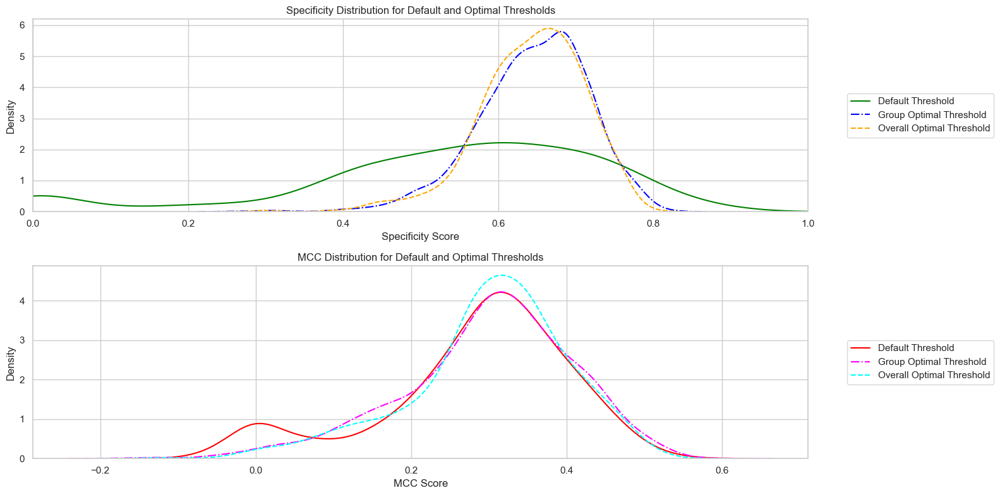

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(16, 8))

# KDE plot for Specificity (Default vs Optimal) 
sns.kdeplot(results_df['specificity default'], ax=ax[0], color='green', label='Default Threshold', linestyle='-')
sns.kdeplot(scores_df['specificity_optimal'], ax=ax[0], color='blue', label='Group Optimal Threshold', linestyle='-.')
sns.kdeplot(results_df['specificity optimal'], ax=ax[0], color='orange', label='Overall Optimal Threshold', linestyle='--')
ax[0].set_title('Specificity Distribution for Default and Optimal Thresholds')
ax[0].set_xlabel('Specificity Score')
ax[0].set_xlim(0, 1)  
ax[0].legend(bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0.)

# KDE plot for MCC (Default vs Optimal) 
sns.kdeplot(results_df['default mcc'], ax=ax[1], color='red', label='Default Threshold', linestyle='-')
sns.kdeplot(scores_df['mcc_optimal'], ax=ax[1], color='magenta', label='Group Optimal Threshold', linestyle='-.')
sns.kdeplot(results_df['optimal threshold mcc'], ax=ax[1], color='cyan', label='Overall Optimal Threshold', linestyle='--')
ax[1].set_title('MCC Distribution for Default and Optimal Thresholds')
ax[1].set_xlabel('MCC Score')
ax[1].legend(bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0.)

plt.tight_layout()
plt.show()


In [636]:

# Calculate Wasserstein distances for Specificity and MCC
specificity_wasserstein_default_optimal = wasserstein_distance(results_df['specificity default'], results_df['specificity optimal'])
specificity_wasserstein_default_group_optimal = wasserstein_distance(results_df['specificity default'], scores_df['specificity_optimal'])
specificity_wasserstein_overall_vs_group_optimal = wasserstein_distance(results_df['specificity optimal'], scores_df['specificity_optimal'])

mcc_wasserstein_default_optimal = wasserstein_distance(results_df['default mcc'], results_df['optimal threshold mcc'])
mcc_wasserstein_default_group_optimal = wasserstein_distance(results_df['default mcc'], scores_df['mcc_optimal'])
mcc_wasserstein_overall_vs_group_optimal = wasserstein_distance(results_df['optimal threshold mcc'], scores_df['mcc_optimal'])

# Print Wasserstein distances
print(f"Wasserstein distance for Specificity (Default vs Overall Optimal): {specificity_wasserstein_default_optimal}")
print(f"Wasserstein distance for Specificity (Default vs Group Optimal): {specificity_wasserstein_default_group_optimal}")
print(f"Wasserstein distance for Specificity (Overall Optimal vs Group Optimal): {specificity_wasserstein_overall_vs_group_optimal}")
print(f"Wasserstein distance for MCC (Default vs Overall Optimal): {mcc_wasserstein_default_optimal}")
print(f"Wasserstein distance for MCC (Default vs Group Optimal): {mcc_wasserstein_default_group_optimal}")
print(f"Wasserstein distance for MCC (Overall Optimal vs Group Optimal): {mcc_wasserstein_overall_vs_group_optimal}")

Wasserstein distance for Specificity (Default vs Overall Optimal): 0.1251746212373229
Wasserstein distance for Specificity (Default vs Group Optimal): 0.12422917149518861
Wasserstein distance for Specificity (Overall Optimal vs Group Optimal): 0.0048242018226945385
Wasserstein distance for MCC (Default vs Overall Optimal): 0.01848154401417899
Wasserstein distance for MCC (Default vs Group Optimal): 0.01598177380861411
Wasserstein distance for MCC (Overall Optimal vs Group Optimal): 0.00888191333959721
